# This notebook explores the effect of the choice of norm on the PINN loss

In [ ]:

import jax
import os



os.environ['XLA_PYTHON_CLIENT_MEM_FRACTION'] = '1.0'
os.environ['CUDA_VISIBLE_DEVICES'] = '2'
print(jax.local_devices())



import jax
jax.config.update("jax_enable_x64", True)

import jax.numpy as jnp
from jax import random, vmap, jit, grad
import jax.scipy as scipy

from jax import random


import matplotlib.pyplot as plt

from utils_rough_pde import *
from utils_elliptic_coef import *

from scipy import integrate

import time

from jax.numpy import fft

from tqdm import tqdm

import math

from jax import grad

from scipy import integrate

In [2]:
from jax import jit, grad, vmap, hessian, value_and_grad
import optax

In [3]:
#plt.style.use('default')
plt.style.use('plot_style-Examples_3d.txt')

# 16:9 aspect ratio
width = 4
height = width * 3 / 4

In [4]:
def discrete_sine_transform(y):
    """
    y is the vector of coefficents of size n. It assumes that it only contains the frequencies 1,2,3,...,n. (no zero frequency)
    returns evaluation of the sine series at the points 1,2,3,...,n (no zero point)
    """
    n = y.shape[0]
    y_extended = jnp.concatenate([jnp.zeros(1), y, jnp.zeros(1), -y[::-1]])
    y_fft = jnp.fft.fft(y_extended)/2
    return (-y_fft.imag)[1: n+1]*jnp.sqrt(2)

vmap_dst = jit(vmap(discrete_sine_transform, in_axes=(0,)))
@jit
def dst_2d(A):
    # Receives a 2d array and returns the 2d discrete sine transform
    return vmap_dst(vmap_dst(A).T).T


@jit
def compute_sine_coef_2d(A):
    # Receives a 2d array and returns the coefficients Fourier space of the sine series by using the DST
    n = A.shape[0]
    return dst_2d(A)/((n+1)**2)

vmap_compute_sine_coef = jit(vmap(compute_sine_coef_2d, in_axes = 0))


def compute_2d_error(pred, u, x, y):
    norm_u = jnp.sqrt(integrate.trapezoid(integrate.trapezoid(u**2, x), y))
    norm_diff = jnp.sqrt(integrate.trapezoid(integrate.trapezoid((pred - u)**2, x), y))
    return norm_diff, norm_diff/norm_u

def create_interior(x, y):
    # Use meshgrid to create the grid of pairs
    A, B = jnp.meshgrid(x, y, indexing='ij')

    # Combine A and B into pairs
    interior = jnp.stack((A, B), axis=-1).reshape(-1, 2)
    return interior

In [5]:
# Define the neural network
def init_params(layer_sizes, key):
    params = []
    keys = random.split(key, len(layer_sizes))
    for m, n, key in zip(layer_sizes[:-1], layer_sizes[1:], keys):
        weights = random.normal(key, (m, n)) * jnp.sqrt(2 / m)
        biases = jnp.zeros(n)
        params.append((weights, biases))
    return params

def init_glorot_normal_params(layer_sizes, key):
    params = []
    keys = random.split(key, len(layer_sizes))
    for m, n, key in zip(layer_sizes[:-1], layer_sizes[1:], keys):
        stddev = jnp.sqrt(2.0 / (m + n))
        weights = stddev * random.normal(key, (m, n))
        biases = jnp.zeros(n)
        params.append((weights, biases))
    return params

def init_glorot_params(layer_sizes, key):
    params = []
    keys = random.split(key, len(layer_sizes))
    for m, n, key in zip(layer_sizes[:-1], layer_sizes[1:], keys):
        glorot_scale = jnp.sqrt(6.0 / (m + n))
        weights = random.uniform(key, (m, n), minval=-glorot_scale, maxval=glorot_scale)
        biases = jnp.zeros(n)
        params.append((weights, biases))
    return params


def predict(params, x):
    activations = x
    for weights, biases in params[:-1]:
        activations = jnp.tanh(jnp.dot(activations, weights) + biases)
    final_weights, final_biases = params[-1]
    return jnp.squeeze(jnp.dot(activations, final_weights) + final_biases)

In [6]:
def count_parameters(params):
    total_params = 0
    for weights, biases in params:
        total_params += weights.size
        total_params += biases.size
    return total_params

# Semilinear example


We will consider the problem 

\begin{aligned}
 -\nu \Delta u + bu+c \sin(\beta 2\pi u) &= \xi \quad x \in \Omega\\
u &= 0 \quad x \in \partial \Omega
\end{aligned}

with a manufactured solution 


\begin{aligned}
u = \sum_{k=1}^\infty\sum_{l=1}^\infty \frac{u_{kl}}{(k^2 + l^2)^{\alpha + \delta}} \sin(\pi k x) \sin(\pi l y) \quad  u_{kl} \sim \mathcal{N}(0, 1)
\end{aligned}


In [7]:
lower = 0.0
upper = 1.0
domain = jnp.array([lower,upper])

In [8]:
key = random.PRNGKey(647023)

c = 1.0
beta = 0.5

n_coef = 2**10
print("Number of coefficients: {} ({} toal)".format(n_coef, n_coef**2))

nu = 1e-1
b = jit(lambda x, y:1)#jit(lambda x, y: jnp.cos(5*jnp.pi*(x**2 + y**4)) + x**2 + jnp.exp(-y**2)+ 1.5)
vmap_b = jit(vmap(vmap(b, in_axes = (None, 0)), in_axes = (0, None)))


x_finest = jnp.linspace(lower,upper,n_coef +1, endpoint=False)[1:] # make sure to exclude the points 0 and 1!
y_finest = jnp.linspace(lower,upper,n_coef +1, endpoint=False)[1:]
X, Y = jnp.meshgrid(x_finest, y_finest)
A, B = jnp.meshgrid(x_finest, y_finest, indexing='ij')
interior_finest = jnp.stack((A, B), axis=-1).reshape(-1, 2)



frequencies = jnp.arange(0, n_coef) + 1

delta = 0.0
alpha = 1.0 # Solution belongs to 1 + 2*epsilon 
random_draw =  random.normal(key, shape= (n_coef,n_coef))


decay = (jnp.arange(1,n_coef + 1)[None]**2 + jnp.arange(1,n_coef+1)[:,None]**2)
coef_u =random_draw*(decay)**(-alpha -delta)
coef_laplacian =coef_u*((nu*jnp.pi**2*decay))


Number of coefficients: 1024 (1048576 toal)


In [9]:
s = 1 -2*delta # Where the right hand side lives (not included). The limit is H^{-1}
s

1.0

In [10]:
tau = jit(lambda x: c*jnp.sin(beta*2*jnp.pi*x))
tau_prime = jit(lambda x: c*jnp.cos(beta*2*jnp.pi*x)*beta*2*jnp.pi)

In [11]:
u_values = dst_2d(coef_u)
f_values = dst_2d(coef_laplacian) + vmap_b(x_finest, y_finest)*u_values + tau(u_values)

In [12]:
coef_f = compute_sine_coef_2d(f_values)
print(jnp.mean(jnp.abs(coef_u - compute_sine_coef_2d(u_values))))

1.6948799255400088e-19


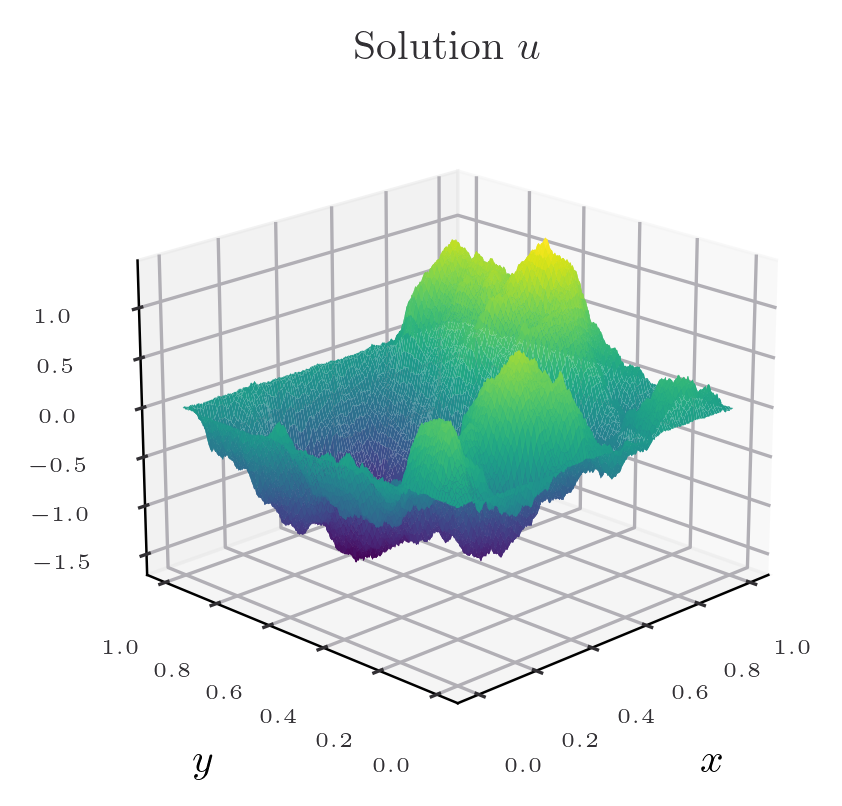

In [13]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 10
ax.plot_surface(X, Y, u_values,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Solution $u$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

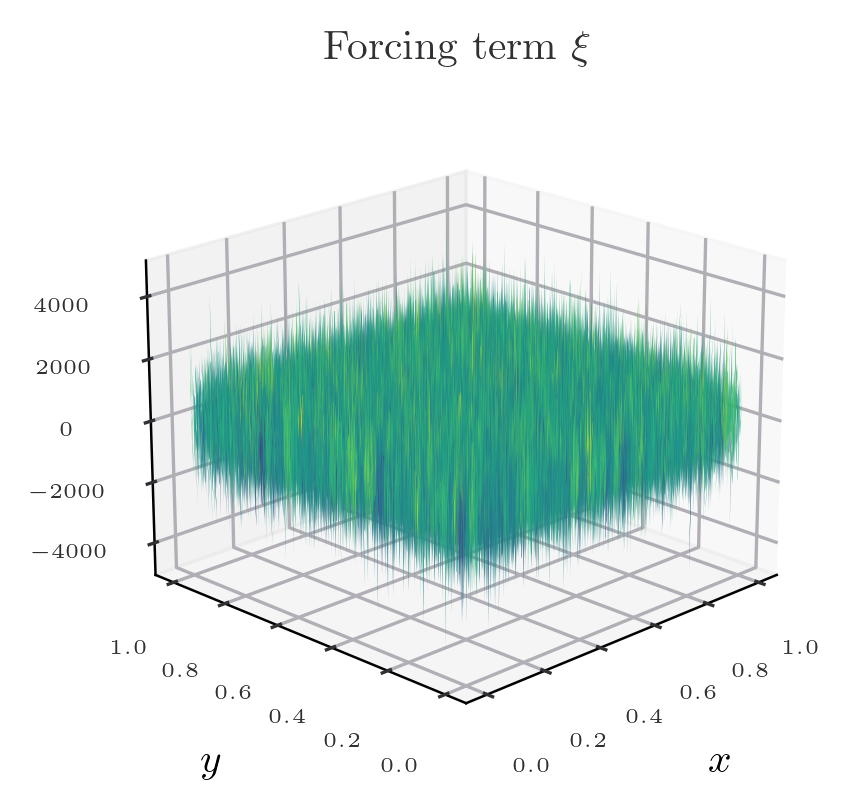

In [14]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

ax.plot_surface(X, Y, f_values,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Forcing term $\xi$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

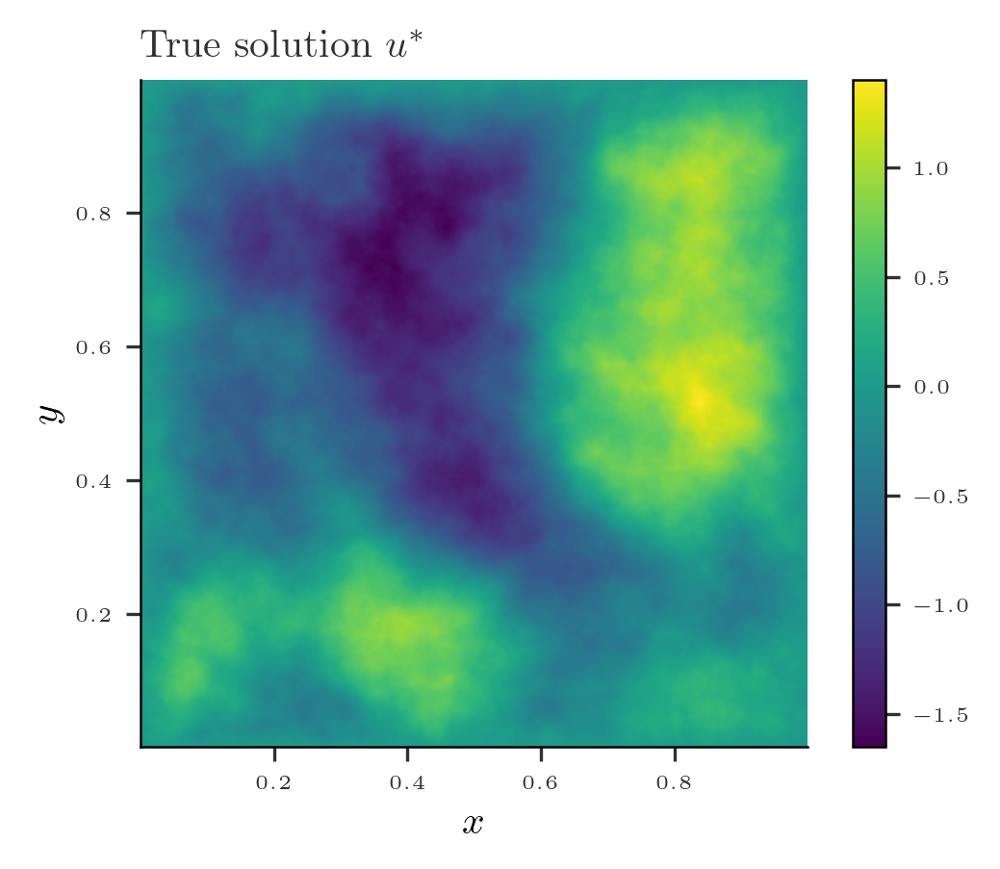

In [15]:
fig = plt.figure(figsize=(width, height))

plt.imshow(u_values[::-1, :], cmap='viridis', extent=[x_finest.min(), x_finest.max(), y_finest.min(), y_finest.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'True solution $u^*$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

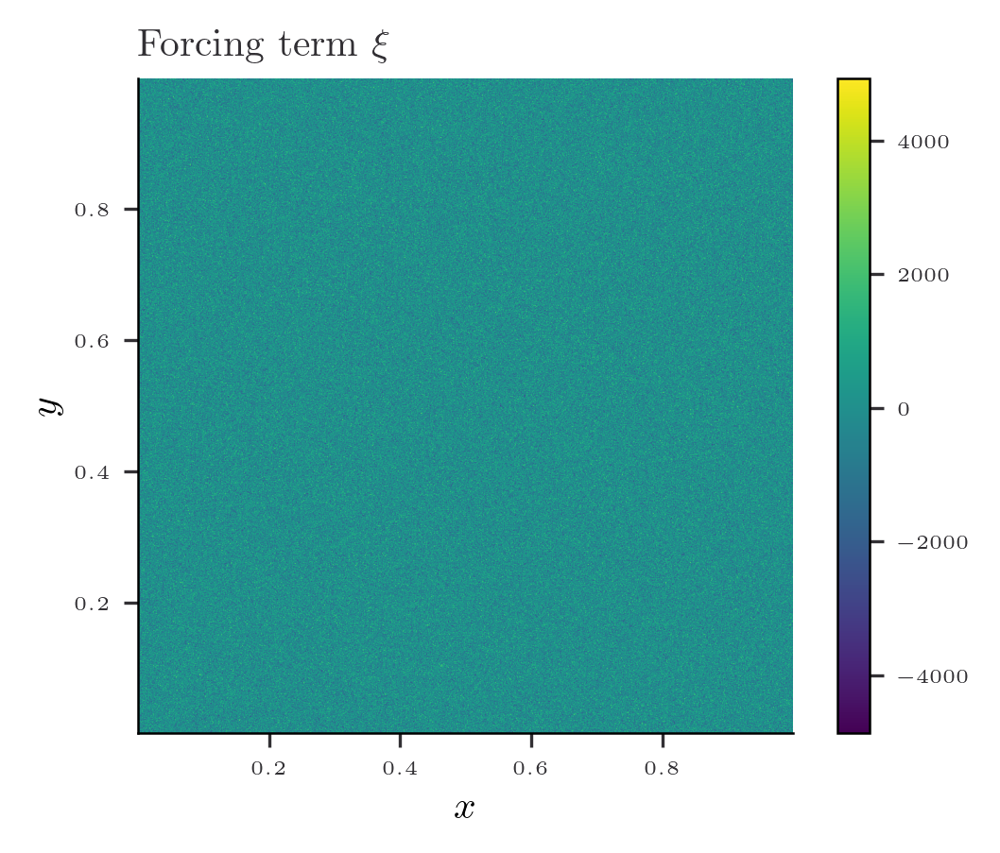

In [16]:
fig = plt.figure(figsize=(width, height))

plt.imshow(f_values[::-1, :], cmap='viridis', extent=[x_finest.min(), x_finest.max(), y_finest.min(), y_finest.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Forcing term $\xi$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

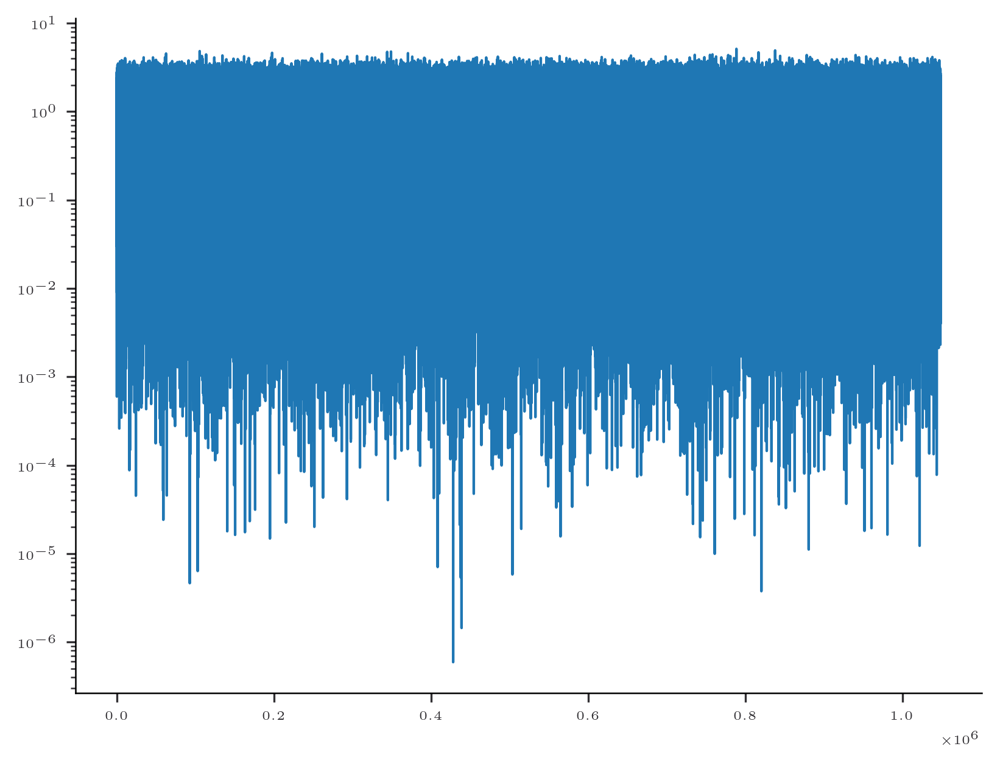

In [17]:
plt.plot(jnp.abs(coef_f.reshape(-1)), label = "f")
plt.yscale("log")
plt.show()

In [18]:
lower = 0.0
upper = 1.0
domain = jnp.array([lower,upper])


# 2d grid 
n_points = 2**6
print("Number of points {} ({} measurements)".format(n_points, n_points**2))
x = jnp.linspace(lower, upper, n_points + 1, endpoint=False)[1:] # remember to not include the points 0 and 1
y = jnp.linspace(lower, upper, n_points + 1, endpoint=False)[1:]
X, Y = jnp.meshgrid(x, y)

# Use meshgrid to create the grid of pairs
A, B = jnp.meshgrid(x, x, indexing='ij')

# Combine A and B into pairs
interior = jnp.stack((A, B), axis=-1).reshape(-1, 2)
print(interior.shape)

Number of points 64 (4096 measurements)
(4096, 2)


In [19]:
# Create the boundary

# Create a boundary
# Boundary points
boundary = jnp.hstack([jnp.zeros(1), x, jnp.zeros(1)])
n_boundary = boundary.shape[0]
print("Number of boundary points: {} ({} total)".format(n_boundary, n_boundary*4))

boundary_points = []
# Creat a discretization of the boundary
for i in [0,1]:
    boundary_points.append(jnp.stack([jnp.zeros(n_boundary) + i, boundary], axis=-1))
for i in [0,1]:
    boundary_points.append(jnp.stack([boundary, jnp.zeros(n_boundary) + i], axis=-1))
    

boundary_points = jnp.concatenate(boundary_points, axis=0)
boundary_condition = jnp.zeros(shape = boundary_points.shape[0])

Number of boundary points: 66 (264 total)


In [20]:
n_eval = 2**8
x_eval = jnp.linspace(lower, upper, n_eval + 1, endpoint=False)[1:] #jnp.hstack([jnp.zeros(1),jnp.linspace(lower, upper, n_eval + 1, endpoint=False)[1:], jnp.zeros(1)])
y_eval = jnp.linspace(lower, upper, n_eval + 1, endpoint=False)[1:] #jnp.hstack([jnp.zeros(1),jnp.linspace(lower, upper, n_eval + 1, endpoint=False)[1:], jnp.zeros(1)])
X, Y = jnp.meshgrid(x_eval, y_eval)

interior_eval = create_interior(x_eval, y_eval)

ratio = int(n_coef/n_eval)
u_eval = u_values[::ratio, ::ratio]


In [21]:
n_points

64

In [23]:
jnp.sqrt(jnp.sum(coef_u[n_points:, n_points:]**2)), jnp.sqrt(jnp.sum(coef_u[n_points:, n_points:]**2))/jnp.sqrt(jnp.sum(coef_u**2))

(Array(0.00583666, dtype=float64), Array(0.00861371, dtype=float64))

# RFF embedding + $L^2$ loss

In [24]:
decay_nugget =  decay = (jnp.arange(1,n_points + 1)[None]**2 + jnp.arange(1,n_points+1)[:,None]**2)**(-0.0)
decay_nugget

Array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]], dtype=float64, weak_type=True)

In [25]:
# Draw random samples for the RF part
n_samples = 32
print('Number of samples: ', n_samples)
d_in = 2

sigma_rff = 5.0
random_features = random.normal(random.PRNGKey(123),  shape = (n_samples, d_in))*sigma_rff


def feature_map(x, random_features):
    outputs = jnp.dot(random_features, x)
    return jnp.hstack([jnp.cos(outputs), jnp.sin(outputs)])

Number of samples:  32


In [26]:
layer_sizes = [n_samples*2, 64, 64,  1]
key = random.PRNGKey(0)
params = init_params(layer_sizes, key)
print("There are {} parameters in the neural network.".format(count_parameters(params)))

There are 8385 parameters in the neural network.


In [27]:
def predict(params, x):
    activations = feature_map(x, random_features)
    for weights, biases in params[:-1]:
        activations = jnp.tanh(jnp.dot(activations, weights) + biases)
    final_weights, final_biases = params[-1]
    return jnp.squeeze(jnp.dot(activations, final_weights) + final_biases)

In [28]:
neural_network = jit(vmap(predict, in_axes=(None, 0)))
def laplacian(params, x):
    return jnp.trace(hessian(predict, argnums=-1)(params, x))
nn_laplacian = jit(vmap(laplacian, in_axes = (None, 0)))

In [29]:
# Define the loss function
def loss_fn(params, grid, boundary, f, boundary_conditions, nu, n_points, w = 1.0):
    u_grid = neural_network(params, grid).reshape(n_points, n_points)
    non_linearity = tau(u_grid)
    laplacian_grid = nn_laplacian(params, grid).reshape(n_points, n_points)
    # Compute the sine transform
    pred_sine = compute_sine_coef_2d(-nu*laplacian_grid + vmap_b(x,y)*u_grid+ non_linearity)
    residual_interior = (pred_sine - f)*decay_nugget

    pred_boundary = neural_network(params, boundary)
    residual_boundary = pred_boundary - boundary_conditions
    return w*jnp.mean(residual_interior**2) + jnp.mean(residual_boundary**2)

In [30]:
f_observed =  coef_f[:n_points,:n_points]
f_observed

Array([[-0.82089554, -2.14859284,  2.3791985 , ...,  0.26563585,
        -0.7940723 , -0.17793415],
       [ 0.84933138,  2.84151398, -1.39662649, ..., -0.15709004,
        -0.48139546,  2.28038787],
       [-0.29017643,  1.06693573, -0.38861401, ...,  0.37299521,
         1.77593612, -0.9827744 ],
       ...,
       [ 0.35287707,  0.63489338,  0.39130747, ...,  2.12387259,
         1.12427352,  0.40291486],
       [ 0.86676858, -1.26121217,  0.52391445, ..., -0.49089108,
        -1.24617576, -0.99688064],
       [ 0.89848174, -1.04691187,  2.99439876, ...,  0.11065843,
         2.65018724,  0.20170837]], dtype=float64)

In [31]:
loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points, w = 1.0)
print(loss, grads)

1.9008710035402192 [(Array([[ 0.00718338,  0.0219522 , -0.00597949, ..., -0.00186115,
         0.0533719 , -0.00395566],
       [ 0.01397147,  0.02280561, -0.02180912, ...,  0.00472019,
         0.06515582, -0.00058074],
       [-0.02743496, -0.0096466 ,  0.06008261, ..., -0.03242494,
        -0.10295961,  0.00484055],
       ...,
       [ 0.02712895,  0.012879  , -0.0510172 , ...,  0.01896294,
         0.09938979, -0.00395097],
       [-0.0147436 , -0.01963385,  0.02104097, ...,  0.00311812,
        -0.06757653, -0.00067668],
       [-0.00223319,  0.00072381,  0.01541232, ..., -0.02605299,
         0.00834574, -0.00414863]], dtype=float64), Array([-0.01838501, -0.00815259,  0.04581123,  0.11213954,  0.17887364,
        0.05639526, -0.14098694,  0.0286288 , -0.01633548, -0.14771482,
        0.00746369, -0.00742117,  0.0539797 ,  0.03659461,  0.0234478 ,
        0.06976313,  0.10169444,  0.10175533, -0.15504177, -0.00215705,
       -0.02190774, -0.0555291 , -0.0218757 , -0.03468356, -0.

In [32]:
# Define the learning rate scheduler
initial_learning_rate = 1e-3
num_epochs = 1e5
decay_steps = num_epochs/10
decay_rate = 0.9

learning_rate_schedule = optax.exponential_decay(
    init_value=initial_learning_rate,
    transition_steps=decay_steps,
    decay_rate=decay_rate,
    transition_begin=0,
    staircase=False
)
optimizer = optax.adam(learning_rate_schedule)
opt_state = optimizer.init(params)

In [33]:
@jit
def train_step(params, opt_state):
    loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points)
    updates, opt_state = optimizer.update(grads, opt_state, params)
    params = optax.apply_updates(params, updates)
    return params, opt_state, loss


In [34]:
patience = jnp.inf  # Number of epochs to wait for improvement
best_loss = float('inf')
epochs_without_improvement = 0

In [35]:
loss_hist = []
for epoch in range(int(num_epochs)):
    params, opt_state, loss = train_step(params, opt_state)
    if epoch % 1e4 == 0:
        print(f'Epoch {epoch}, Loss: {loss:.7f}')
    loss_hist.append(loss)

    if epoch % decay_steps == 0:
        current_learning_rate = learning_rate_schedule(epoch)
        print(f'Step {epoch}, Training Loss: {loss:.7f}, Learning Rate: {current_learning_rate:.6f}')

    if loss < best_loss:
        best_loss = loss
        epochs_without_improvement = 0
        #best_param = params.copy()
    else:
        epochs_without_improvement += 1

    if epochs_without_improvement >= patience:
        print(f'Early stopping at epoch {epoch}')
        break

Epoch 0, Loss: 1.9008710
Step 0, Training Loss: 1.9008710, Learning Rate: 0.001000
Epoch 10000, Loss: 0.0004486
Step 10000, Training Loss: 0.0004486, Learning Rate: 0.000900
Epoch 20000, Loss: 0.0000589
Step 20000, Training Loss: 0.0000589, Learning Rate: 0.000810
Epoch 30000, Loss: 0.0000441
Step 30000, Training Loss: 0.0000441, Learning Rate: 0.000729
Epoch 40000, Loss: 0.0000493
Step 40000, Training Loss: 0.0000493, Learning Rate: 0.000656
Epoch 50000, Loss: 0.0000658
Step 50000, Training Loss: 0.0000658, Learning Rate: 0.000590
Epoch 60000, Loss: 0.0001535
Step 60000, Training Loss: 0.0001535, Learning Rate: 0.000531
Epoch 70000, Loss: 0.0000679
Step 70000, Training Loss: 0.0000679, Learning Rate: 0.000478
Epoch 80000, Loss: 0.0000229
Step 80000, Training Loss: 0.0000229, Learning Rate: 0.000430
Epoch 90000, Loss: 0.0000295
Step 90000, Training Loss: 0.0000295, Learning Rate: 0.000387


In [36]:
loss

Array(9.23780539e-06, dtype=float64)

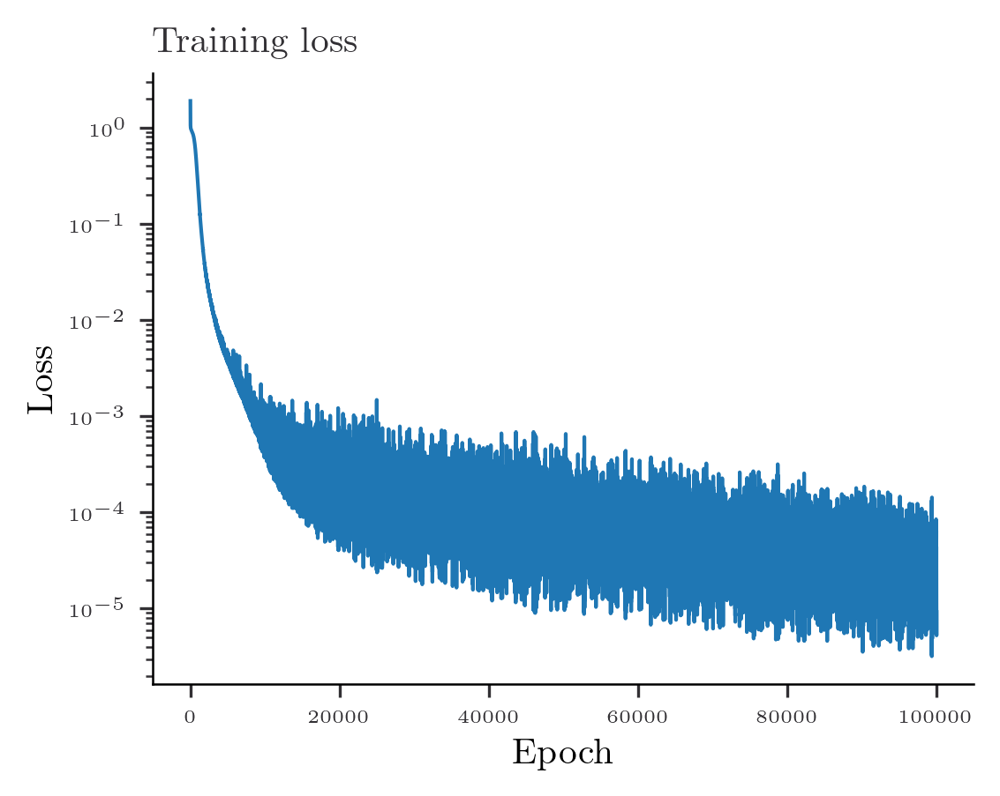

In [37]:
fig = plt.figure(figsize=(width, height))
plt.plot(loss_hist)
plt.yscale('log')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training loss')
plt.show()

In [38]:
pred_grid = neural_network(params, interior_eval).reshape(n_eval, n_eval)

In [39]:
print(compute_2d_error(pred_grid, u_eval, x_eval, y_eval))

(Array(0.34703757, dtype=float64), Array(0.51366735, dtype=float64))


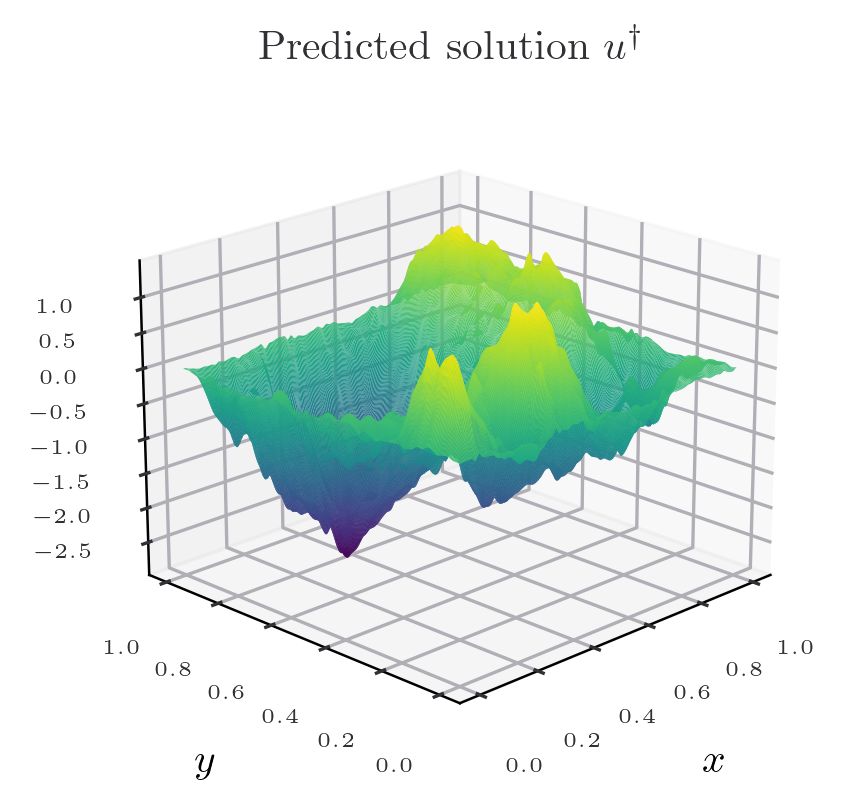

In [40]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, pred_grid,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Predicted solution $u^\dagger$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

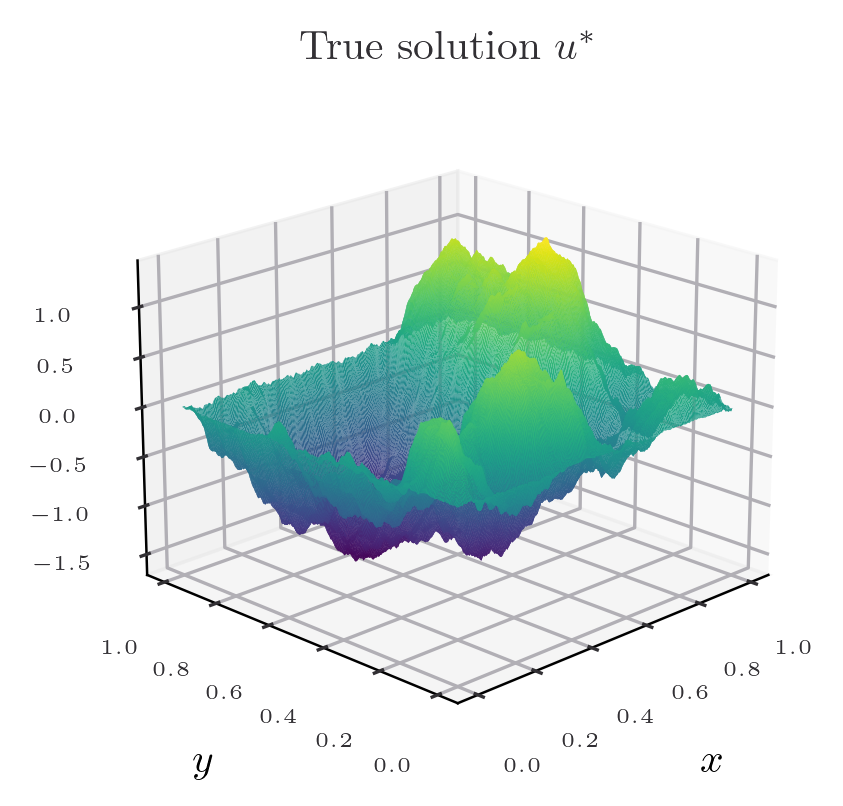

In [41]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, u_eval,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"True solution $u^*$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

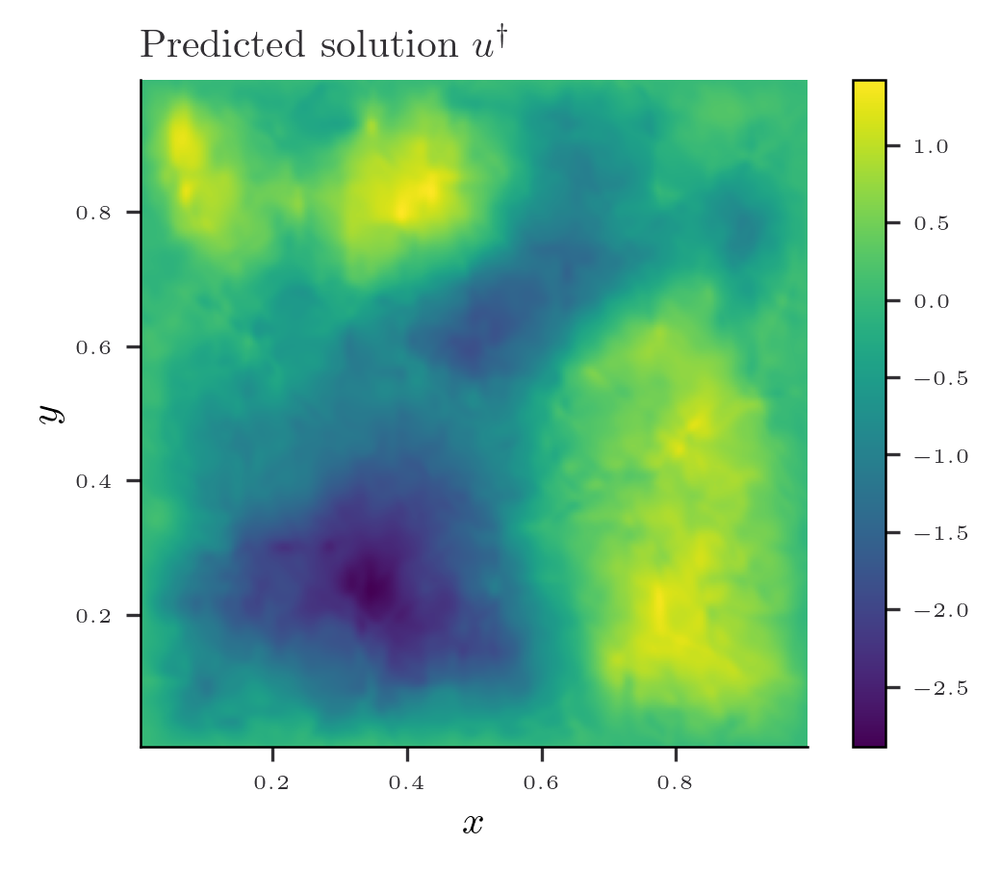

In [42]:
fig = plt.figure(figsize=(width, height))

plt.imshow(pred_grid, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Predicted solution $u^\dagger$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

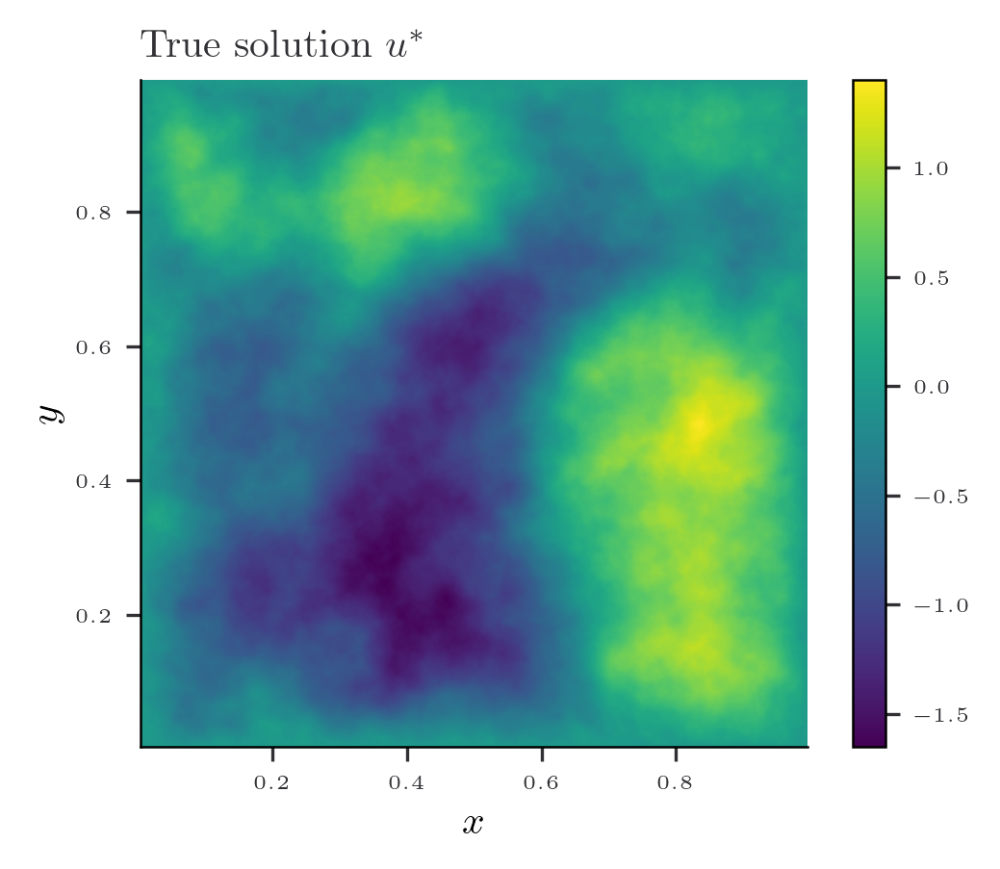

In [43]:
fig = plt.figure(figsize=(width, height))

plt.imshow(u_values, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'True solution $u^*$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

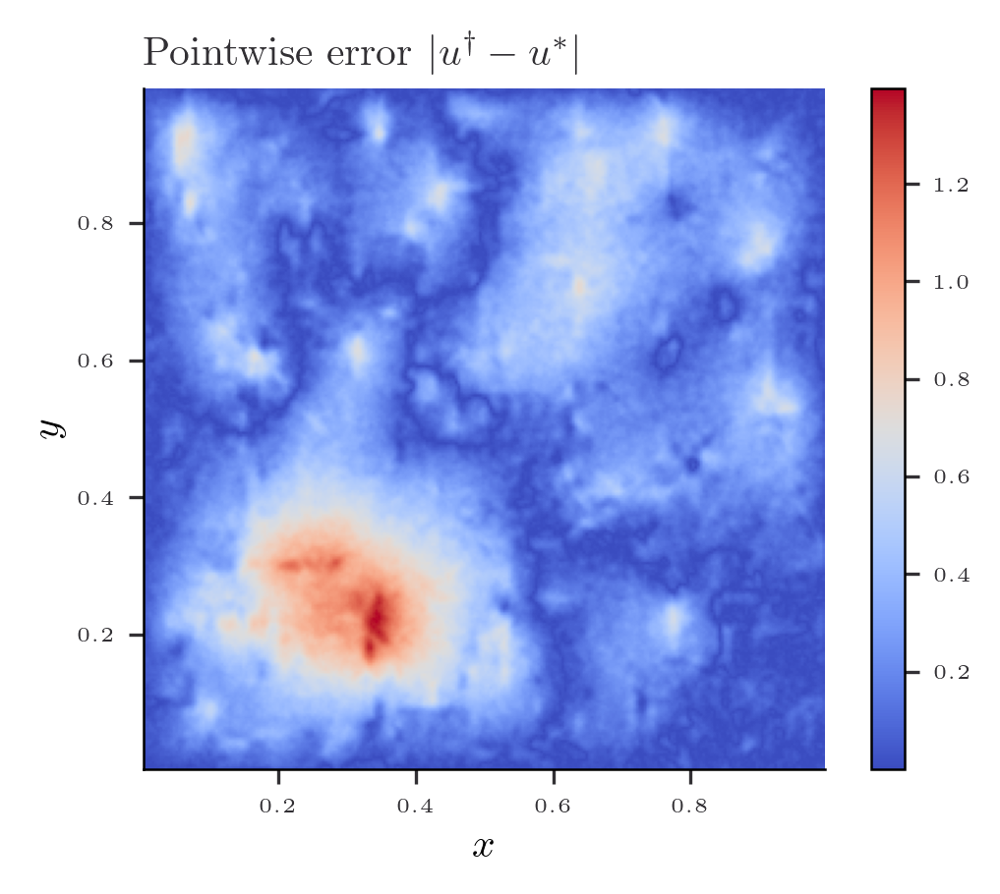

In [44]:
fig = plt.figure(figsize=(width, height))

plt.imshow(jnp.abs(pred_grid - u_eval), cmap='coolwarm', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Pointwise error $|u^\dagger - u^*|$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

# RFF embedding $H^{-1/2}$

In [45]:
t = 0.5

In [46]:
decay_nugget =  decay = (jnp.arange(1,n_points + 1)[None]**2 + jnp.arange(1,n_points+1)[:,None]**2)**(-t/2)
decay_nugget

Array([[0.84089642, 0.6687403 , 0.56234133, ..., 0.12699187, 0.12598022,
        0.12499237],
       [0.6687403 , 0.59460356, 0.52664039, ..., 0.12696711, 0.12595643,
        0.1249695 ],
       [0.56234133, 0.52664039, 0.48549177, ..., 0.1269259 , 0.12591684,
        0.12493143],
       ...,
       [0.12699187, 0.12696711, 0.1269259 , ..., 0.10679395, 0.10636422,
        0.10593632],
       [0.12598022, 0.12595643, 0.12591684, ..., 0.10636422, 0.10594299,
        0.10552343],
       [0.12499237, 0.1249695 , 0.12493143, ..., 0.10593632, 0.10552343,
        0.10511205]], dtype=float64, weak_type=True)

In [47]:
# Draw random samples for the RF part
n_samples = 32
print('Number of samples: ', n_samples)
d_in = 2

sigma_rff = 5.0
random_features = random.normal(random.PRNGKey(123),  shape = (n_samples, d_in))*sigma_rff


def feature_map(x, random_features):
    outputs = jnp.dot(random_features, x)
    return jnp.hstack([jnp.cos(outputs), jnp.sin(outputs)])

Number of samples:  32


In [48]:
layer_sizes = [n_samples*2, 64, 64,  1]
key = random.PRNGKey(0)
params = init_params(layer_sizes, key)
print("There are {} parameters in the neural network.".format(count_parameters(params)))

There are 8385 parameters in the neural network.


In [49]:
def predict(params, x):
    activations = feature_map(x, random_features)
    for weights, biases in params[:-1]:
        activations = jnp.tanh(jnp.dot(activations, weights) + biases)
    final_weights, final_biases = params[-1]
    return jnp.squeeze(jnp.dot(activations, final_weights) + final_biases)

In [50]:
neural_network = jit(vmap(predict, in_axes=(None, 0)))
def laplacian(params, x):
    return jnp.trace(hessian(predict, argnums=-1)(params, x))
nn_laplacian = jit(vmap(laplacian, in_axes = (None, 0)))

In [51]:
# Define the loss function
def loss_fn(params, grid, boundary, f, boundary_conditions, nu, n_points, w = 1.0):
    u_grid = neural_network(params, grid).reshape(n_points, n_points)
    non_linearity = tau(u_grid)
    laplacian_grid = nn_laplacian(params, grid).reshape(n_points, n_points)
    # Compute the sine transform
    pred_sine = compute_sine_coef_2d(-nu*laplacian_grid + vmap_b(x,y)*u_grid+ non_linearity)
    residual_interior = (pred_sine - f)*decay_nugget

    pred_boundary = neural_network(params, boundary)
    residual_boundary = pred_boundary - boundary_conditions
    return w*jnp.mean(residual_interior**2) + jnp.mean(residual_boundary**2)

In [52]:
f_observed =  coef_f[:n_points,:n_points]
f_observed

Array([[-0.82089554, -2.14859284,  2.3791985 , ...,  0.26563585,
        -0.7940723 , -0.17793415],
       [ 0.84933138,  2.84151398, -1.39662649, ..., -0.15709004,
        -0.48139546,  2.28038787],
       [-0.29017643,  1.06693573, -0.38861401, ...,  0.37299521,
         1.77593612, -0.9827744 ],
       ...,
       [ 0.35287707,  0.63489338,  0.39130747, ...,  2.12387259,
         1.12427352,  0.40291486],
       [ 0.86676858, -1.26121217,  0.52391445, ..., -0.49089108,
        -1.24617576, -0.99688064],
       [ 0.89848174, -1.04691187,  2.99439876, ...,  0.11065843,
         2.65018724,  0.20170837]], dtype=float64)

In [53]:
loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points, w = 1.0)
print(loss, grads)

0.8812359738335716 [(Array([[ 0.00748949,  0.02167558, -0.00875589, ...,  0.00146544,
         0.0551026 , -0.00491265],
       [ 0.01384795,  0.02127378, -0.02427286, ...,  0.00452014,
         0.06510285, -0.00136772],
       [-0.02669104, -0.00915921,  0.05902879, ..., -0.03275478,
        -0.10227157,  0.00577101],
       ...,
       [ 0.02674568,  0.0112632 , -0.05059059, ...,  0.0194444 ,
         0.10034594, -0.00478003],
       [-0.01502977, -0.01997623,  0.01678836, ...,  0.00252657,
        -0.0725464 , -0.00209956],
       [-0.00365965,  0.00027331,  0.01622829, ..., -0.02540732,
         0.00695647, -0.00391224]], dtype=float64), Array([-0.01763258, -0.00798325,  0.04842453,  0.10905002,  0.1792452 ,
        0.0554365 , -0.13951008,  0.03033578, -0.01868477, -0.14451904,
        0.00677717, -0.00811864,  0.05734572,  0.0357777 ,  0.02386109,
        0.0710142 ,  0.09652042,  0.10415106, -0.15502533, -0.00303272,
       -0.02018281, -0.05078823, -0.02140883, -0.03403872, -0.

In [54]:
# Define the learning rate scheduler
initial_learning_rate = 1e-3
num_epochs = 1e5
decay_steps = num_epochs/10
decay_rate = 0.9

learning_rate_schedule = optax.exponential_decay(
    init_value=initial_learning_rate,
    transition_steps=decay_steps,
    decay_rate=decay_rate,
    transition_begin=0,
    staircase=False
)
optimizer = optax.adam(learning_rate_schedule)
opt_state = optimizer.init(params)

In [55]:
@jit
def train_step(params, opt_state):
    loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points)
    updates, opt_state = optimizer.update(grads, opt_state, params)
    params = optax.apply_updates(params, updates)
    return params, opt_state, loss


In [56]:
patience = jnp.inf  # Number of epochs to wait for improvement
best_loss = float('inf')
epochs_without_improvement = 0

In [57]:
loss_hist = []
for epoch in range(int(num_epochs)):
    params, opt_state, loss = train_step(params, opt_state)
    if epoch % 1e4 == 0:
        print(f'Epoch {epoch}, Loss: {loss:.7f}')
    loss_hist.append(loss)

    if epoch % decay_steps == 0:
        current_learning_rate = learning_rate_schedule(epoch)
        print(f'Step {epoch}, Training Loss: {loss:.7f}, Learning Rate: {current_learning_rate:.6f}')

    if loss < best_loss:
        best_loss = loss
        epochs_without_improvement = 0
        #best_param = params.copy()
    else:
        epochs_without_improvement += 1

    if epochs_without_improvement >= patience:
        print(f'Early stopping at epoch {epoch}')
        break

Epoch 0, Loss: 0.8812360
Step 0, Training Loss: 0.8812360, Learning Rate: 0.001000
Epoch 10000, Loss: 0.0022109
Step 10000, Training Loss: 0.0022109, Learning Rate: 0.000900
Epoch 20000, Loss: 0.0004829
Step 20000, Training Loss: 0.0004829, Learning Rate: 0.000810
Epoch 30000, Loss: 0.0001748
Step 30000, Training Loss: 0.0001748, Learning Rate: 0.000729
Epoch 40000, Loss: 0.0000634
Step 40000, Training Loss: 0.0000634, Learning Rate: 0.000656
Epoch 50000, Loss: 0.0000256
Step 50000, Training Loss: 0.0000256, Learning Rate: 0.000590
Epoch 60000, Loss: 0.0000189
Step 60000, Training Loss: 0.0000189, Learning Rate: 0.000531
Epoch 70000, Loss: 0.0000642
Step 70000, Training Loss: 0.0000642, Learning Rate: 0.000478
Epoch 80000, Loss: 0.0000072
Step 80000, Training Loss: 0.0000072, Learning Rate: 0.000430
Epoch 90000, Loss: 0.0000029
Step 90000, Training Loss: 0.0000029, Learning Rate: 0.000387


In [58]:
loss

Array(1.80721887e-06, dtype=float64)

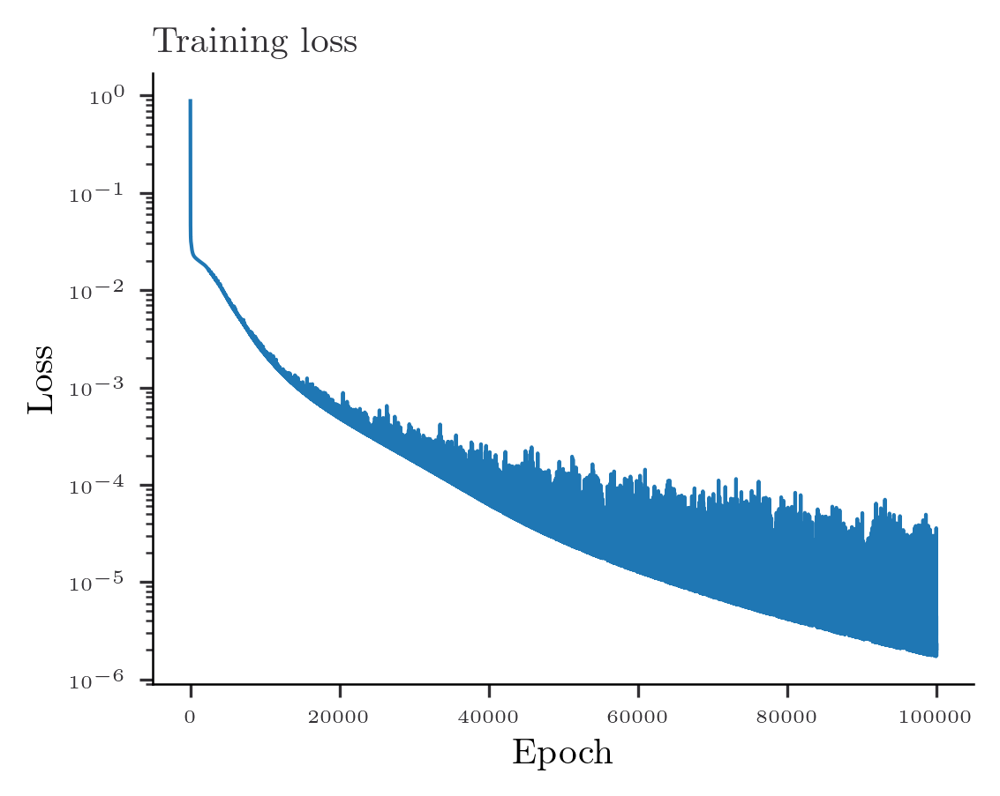

In [59]:
fig = plt.figure(figsize=(width, height))
plt.plot(loss_hist)
plt.yscale('log')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training loss')
plt.show()

In [60]:
pred_grid = neural_network(params, interior_eval).reshape(n_eval, n_eval)

In [61]:
print(compute_2d_error(pred_grid, u_eval, x_eval, y_eval))

(Array(0.29332561, dtype=float64), Array(0.43416565, dtype=float64))


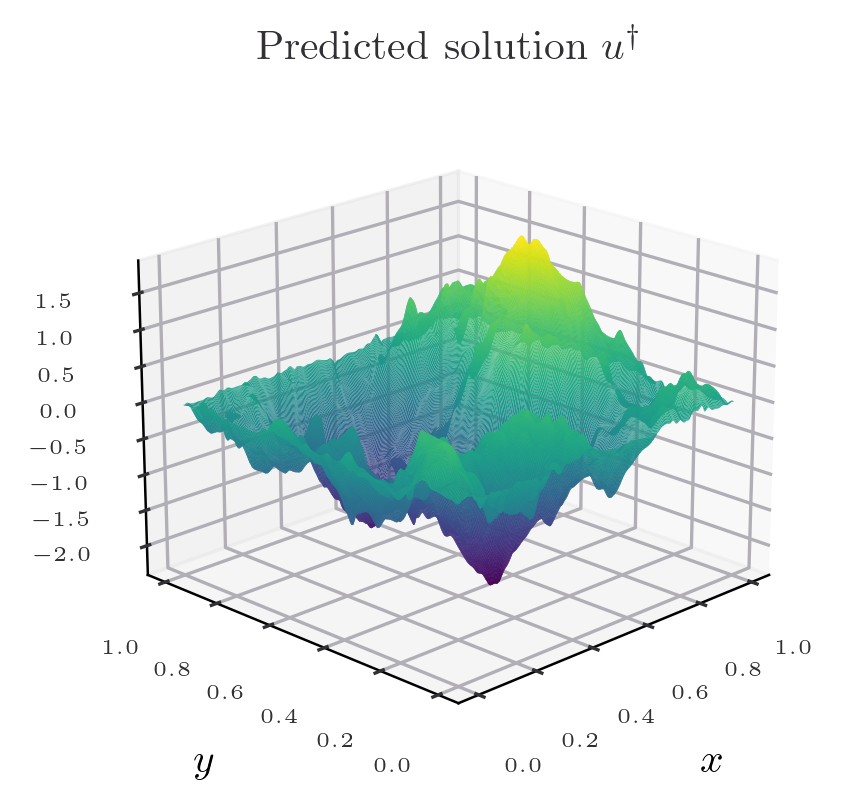

In [62]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, pred_grid,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Predicted solution $u^\dagger$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

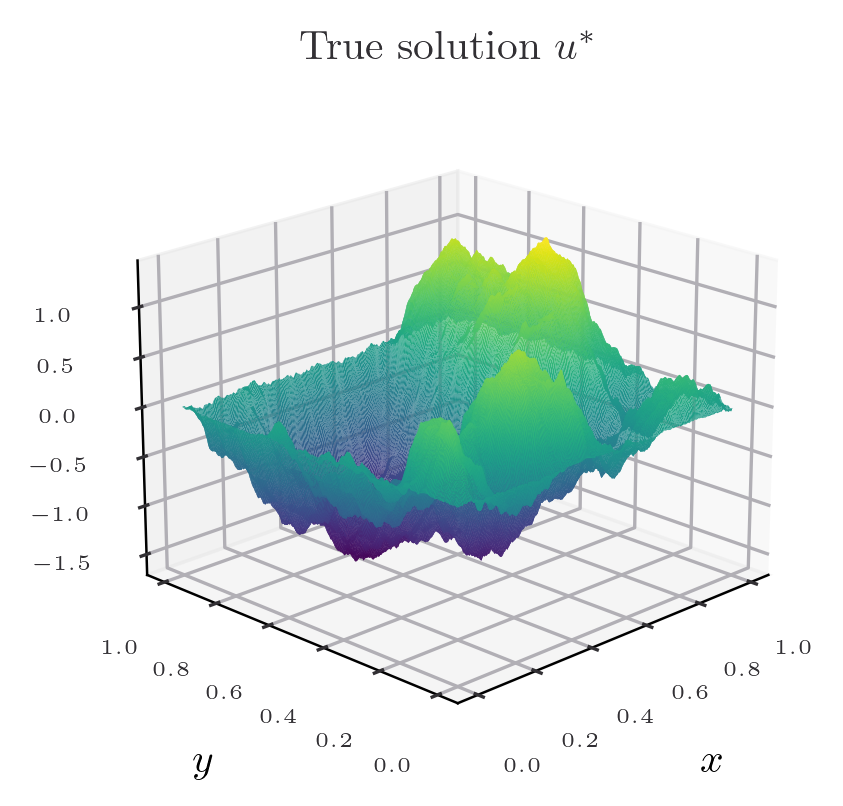

In [63]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, u_eval,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"True solution $u^*$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

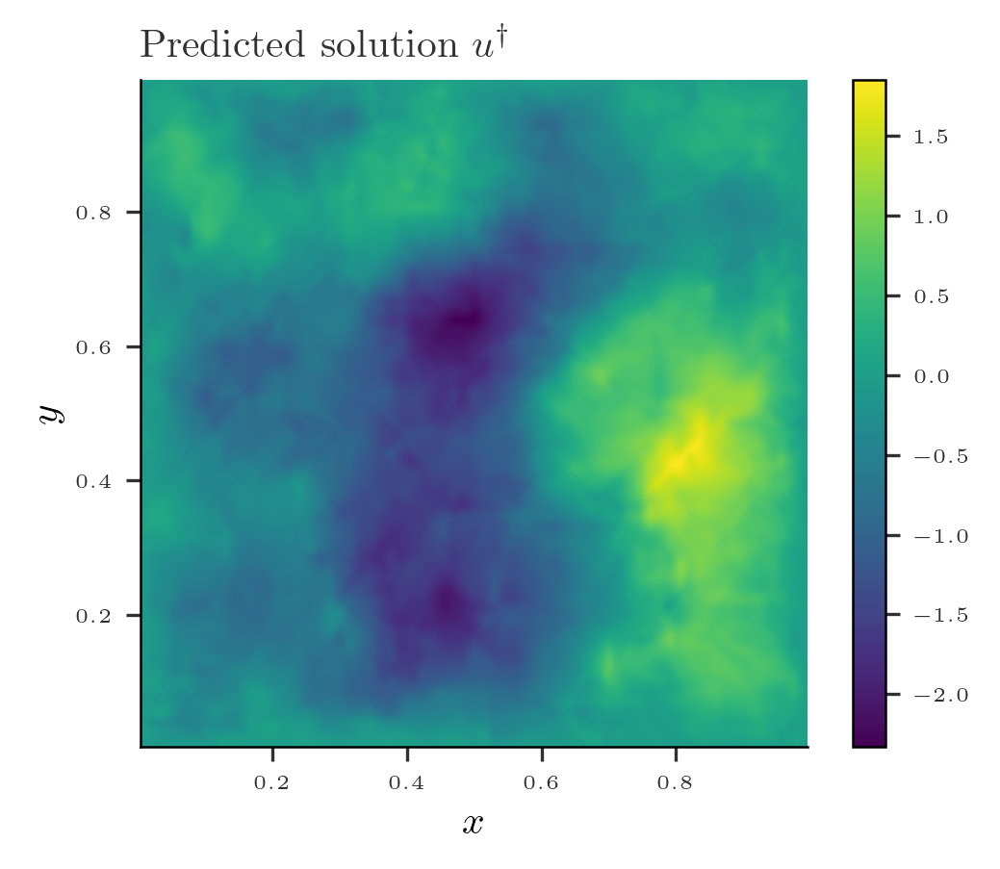

In [64]:
fig = plt.figure(figsize=(width, height))

plt.imshow(pred_grid, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Predicted solution $u^\dagger$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

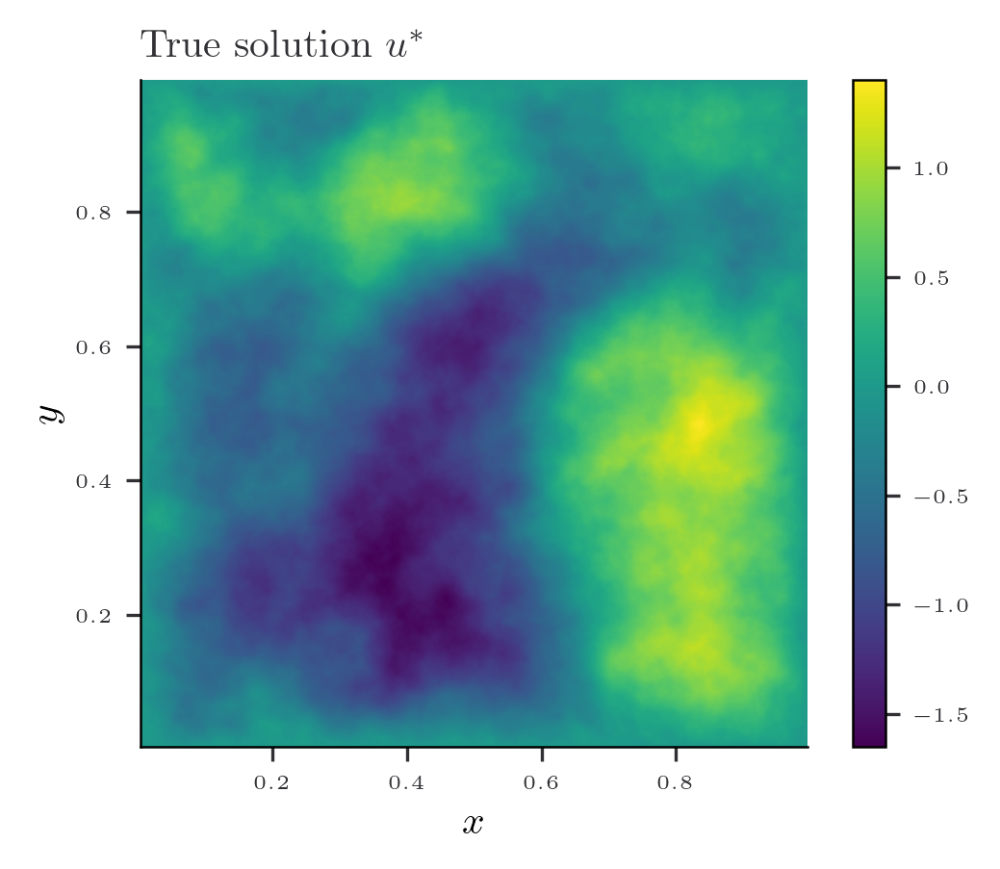

In [65]:
fig = plt.figure(figsize=(width, height))

plt.imshow(u_values, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'True solution $u^*$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

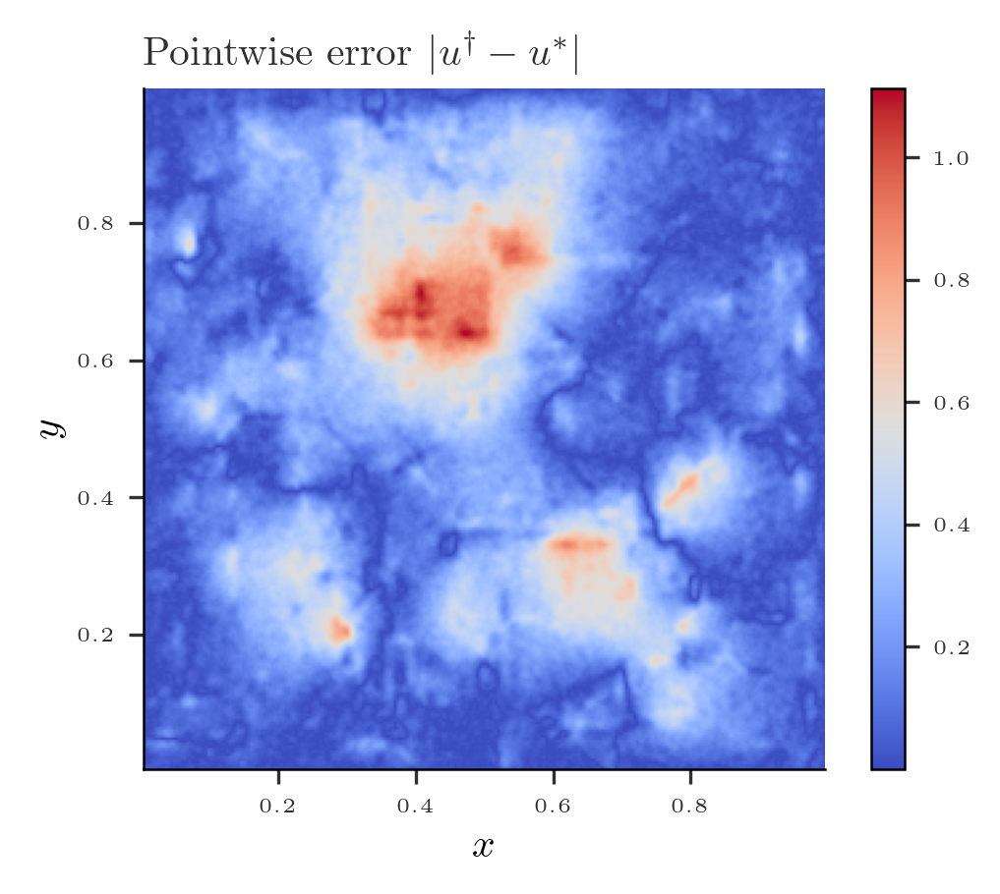

In [66]:
fig = plt.figure(figsize=(width, height))

plt.imshow(jnp.abs(pred_grid - u_eval), cmap='coolwarm', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Pointwise error $|u^\dagger - u^*|$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

# RFF embedding + $H^{-1}$ norm

In [67]:
t = 1.0

In [68]:
decay_nugget =  decay = (jnp.arange(1,n_points + 1)[None]**2 + jnp.arange(1,n_points+1)[:,None]**2)**(-t/2)
decay_nugget

Array([[0.70710678, 0.4472136 , 0.31622777, ..., 0.01612693, 0.01587102,
        0.01562309],
       [0.4472136 , 0.35355339, 0.2773501 , ..., 0.01612065, 0.01586502,
        0.01561738],
       [0.31622777, 0.2773501 , 0.23570226, ..., 0.01611018, 0.01585505,
        0.01560786],
       ...,
       [0.01612693, 0.01612065, 0.01611018, ..., 0.01140495, 0.01131335,
        0.0112225 ],
       [0.01587102, 0.01586502, 0.01585505, ..., 0.01131335, 0.01122392,
        0.01113519],
       [0.01562309, 0.01561738, 0.01560786, ..., 0.0112225 , 0.01113519,
        0.01104854]], dtype=float64, weak_type=True)

In [69]:
# Draw random samples for the RF part
n_samples = 32
print('Number of samples: ', n_samples)
d_in = 2

sigma_rff = 5.0
random_features = random.normal(random.PRNGKey(123),  shape = (n_samples, d_in))*sigma_rff


def feature_map(x, random_features):
    outputs = jnp.dot(random_features, x)
    return jnp.hstack([jnp.cos(outputs), jnp.sin(outputs)])

Number of samples:  32


In [70]:
layer_sizes = [n_samples*2, 64, 64,  1]
key = random.PRNGKey(0)
params = init_params(layer_sizes, key)
print("There are {} parameters in the neural network.".format(count_parameters(params)))

There are 8385 parameters in the neural network.


In [71]:
def predict(params, x):
    activations = feature_map(x, random_features)
    for weights, biases in params[:-1]:
        activations = jnp.tanh(jnp.dot(activations, weights) + biases)
    final_weights, final_biases = params[-1]
    return jnp.squeeze(jnp.dot(activations, final_weights) + final_biases)

In [72]:
neural_network = jit(vmap(predict, in_axes=(None, 0)))
def laplacian(params, x):
    return jnp.trace(hessian(predict, argnums=-1)(params, x))
nn_laplacian = jit(vmap(laplacian, in_axes = (None, 0)))

In [73]:
# Define the loss function
def loss_fn(params, grid, boundary, f, boundary_conditions, nu, n_points, w = 1.0):
    u_grid = neural_network(params, grid).reshape(n_points, n_points)
    non_linearity = tau(u_grid)
    laplacian_grid = nn_laplacian(params, grid).reshape(n_points, n_points)
    # Compute the sine transform
    pred_sine = compute_sine_coef_2d(-nu*laplacian_grid + vmap_b(x,y)*u_grid+ non_linearity)
    residual_interior = (pred_sine - f)*decay_nugget

    pred_boundary = neural_network(params, boundary)
    residual_boundary = pred_boundary - boundary_conditions
    return w*jnp.mean(residual_interior**2) + jnp.mean(residual_boundary**2)

In [74]:
f_observed =  coef_f[:n_points,:n_points]
f_observed

Array([[-0.82089554, -2.14859284,  2.3791985 , ...,  0.26563585,
        -0.7940723 , -0.17793415],
       [ 0.84933138,  2.84151398, -1.39662649, ..., -0.15709004,
        -0.48139546,  2.28038787],
       [-0.29017643,  1.06693573, -0.38861401, ...,  0.37299521,
         1.77593612, -0.9827744 ],
       ...,
       [ 0.35287707,  0.63489338,  0.39130747, ...,  2.12387259,
         1.12427352,  0.40291486],
       [ 0.86676858, -1.26121217,  0.52391445, ..., -0.49089108,
        -1.24617576, -0.99688064],
       [ 0.89848174, -1.04691187,  2.99439876, ...,  0.11065843,
         2.65018724,  0.20170837]], dtype=float64)

In [75]:
loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points, w = 1.0)
print(loss, grads)

0.8483343586079525 [(Array([[ 0.00754017,  0.02151756, -0.00932774, ...,  0.00195597,
         0.05534072, -0.00503019],
       [ 0.0137862 ,  0.02103646, -0.02451195, ...,  0.00444642,
         0.06511684, -0.00140434],
       [-0.02660424, -0.00908011,  0.05887067, ..., -0.0328485 ,
        -0.10205905,  0.00582345],
       ...,
       [ 0.02669176,  0.01105261, -0.05056101, ...,  0.01953111,
         0.10029784, -0.00484056],
       [-0.01508103, -0.02002645,  0.01645756, ...,  0.00257688,
        -0.07297774, -0.00219578],
       [-0.00383786,  0.00024491,  0.0163926 , ..., -0.02536807,
         0.00677755, -0.00392534]], dtype=float64), Array([-0.01758844, -0.0080685 ,  0.04870106,  0.10869986,  0.17921098,
        0.05527856, -0.13940589,  0.03048353, -0.0189195 , -0.14396187,
        0.00655577, -0.00817019,  0.0579721 ,  0.03582987,  0.02389149,
        0.0711197 ,  0.09564852,  0.10452533, -0.15502189, -0.00307486,
       -0.02013495, -0.05021012, -0.02119477, -0.03397399, -0.

In [76]:
# Define the learning rate scheduler
initial_learning_rate = 1e-3
num_epochs = 1e5
decay_steps = num_epochs/10
decay_rate = 0.9

learning_rate_schedule = optax.exponential_decay(
    init_value=initial_learning_rate,
    transition_steps=decay_steps,
    decay_rate=decay_rate,
    transition_begin=0,
    staircase=False
)
optimizer = optax.adam(learning_rate_schedule)
opt_state = optimizer.init(params)

In [77]:
@jit
def train_step(params, opt_state):
    loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points)
    updates, opt_state = optimizer.update(grads, opt_state, params)
    params = optax.apply_updates(params, updates)
    return params, opt_state, loss


In [78]:
patience = jnp.inf  # Number of epochs to wait for improvement
best_loss = float('inf')
epochs_without_improvement = 0

In [79]:
loss_hist = []
for epoch in range(int(num_epochs)):
    params, opt_state, loss = train_step(params, opt_state)
    if epoch % 1e4 == 0:
        print(f'Epoch {epoch}, Loss: {loss:.7f}')
    loss_hist.append(loss)

    if epoch % decay_steps == 0:
        current_learning_rate = learning_rate_schedule(epoch)
        print(f'Step {epoch}, Training Loss: {loss:.7f}, Learning Rate: {current_learning_rate:.6f}')

    if loss < best_loss:
        best_loss = loss
        epochs_without_improvement = 0
        #best_param = params.copy()
    else:
        epochs_without_improvement += 1

    if epochs_without_improvement >= patience:
        print(f'Early stopping at epoch {epoch}')
        break

Epoch 0, Loss: 0.8483344
Step 0, Training Loss: 0.8483344, Learning Rate: 0.001000
Epoch 10000, Loss: 0.0004162
Step 10000, Training Loss: 0.0004162, Learning Rate: 0.000900
Epoch 20000, Loss: 0.0003108
Step 20000, Training Loss: 0.0003108, Learning Rate: 0.000810
Epoch 30000, Loss: 0.0002316
Step 30000, Training Loss: 0.0002316, Learning Rate: 0.000729
Epoch 40000, Loss: 0.0001919
Step 40000, Training Loss: 0.0001919, Learning Rate: 0.000656
Epoch 50000, Loss: 0.0001654
Step 50000, Training Loss: 0.0001654, Learning Rate: 0.000590
Epoch 60000, Loss: 0.0001397
Step 60000, Training Loss: 0.0001397, Learning Rate: 0.000531
Epoch 70000, Loss: 0.0001207
Step 70000, Training Loss: 0.0001207, Learning Rate: 0.000478
Epoch 80000, Loss: 0.0001067
Step 80000, Training Loss: 0.0001067, Learning Rate: 0.000430
Epoch 90000, Loss: 0.0001101
Step 90000, Training Loss: 0.0001101, Learning Rate: 0.000387


In [80]:
loss

Array(8.14212508e-05, dtype=float64)

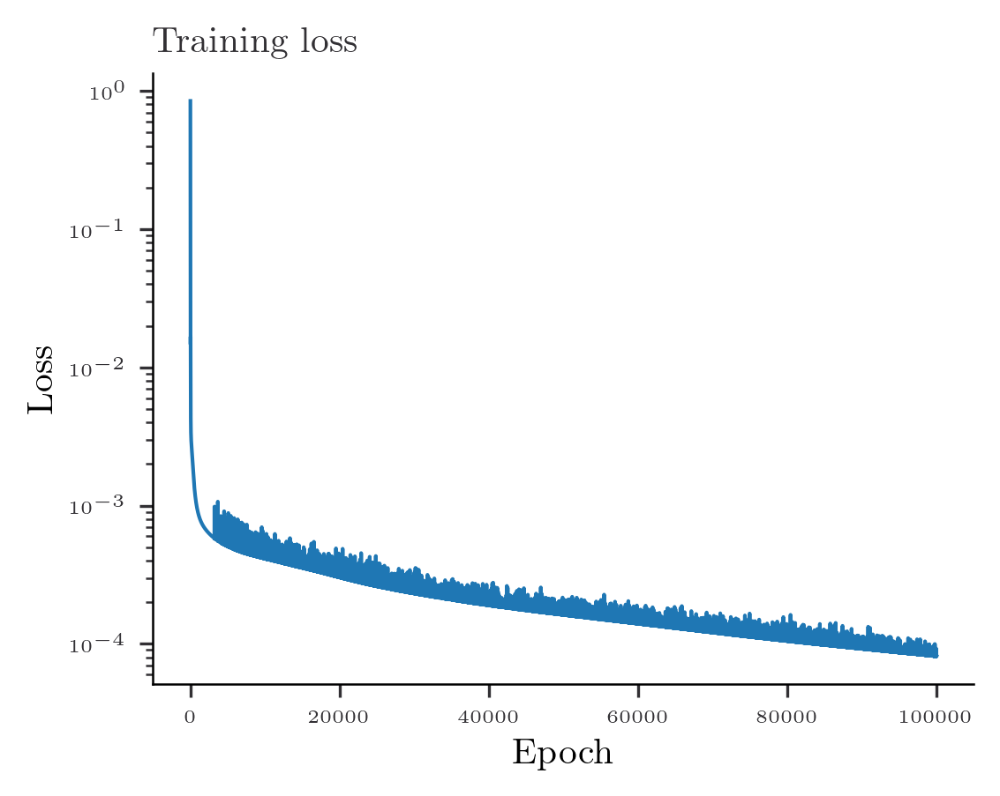

In [81]:
fig = plt.figure(figsize=(width, height))
plt.plot(loss_hist)
plt.yscale('log')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training loss')
plt.show()

In [82]:
pred_grid = neural_network(params, interior_eval).reshape(n_eval, n_eval)

In [83]:
print(compute_2d_error(pred_grid, u_eval, x_eval, y_eval))

(Array(0.07866389, dtype=float64), Array(0.11643428, dtype=float64))


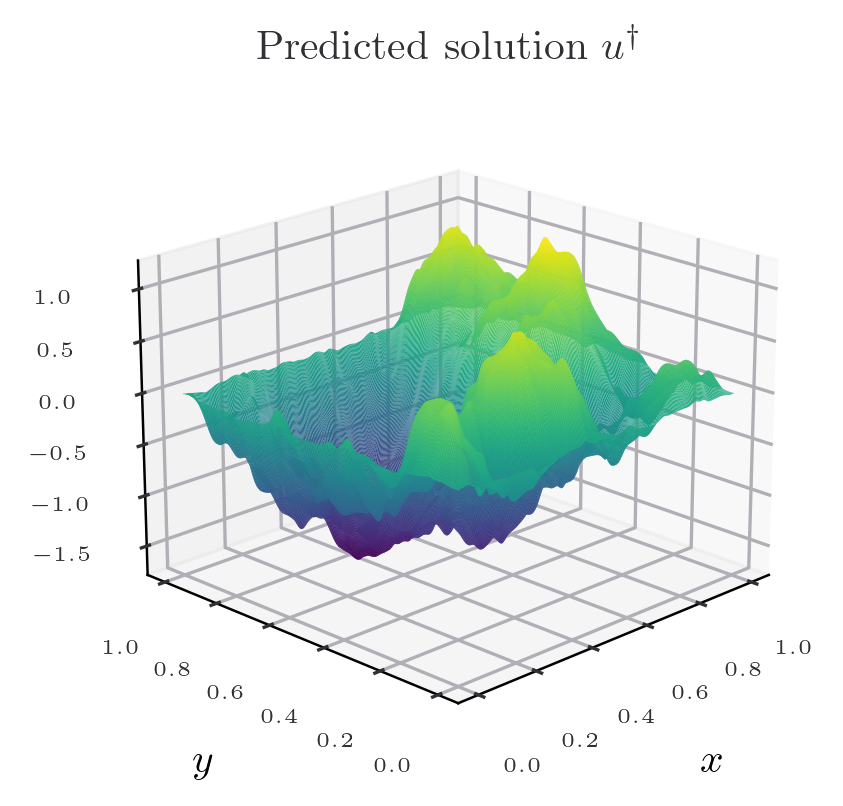

In [84]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, pred_grid,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Predicted solution $u^\dagger$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

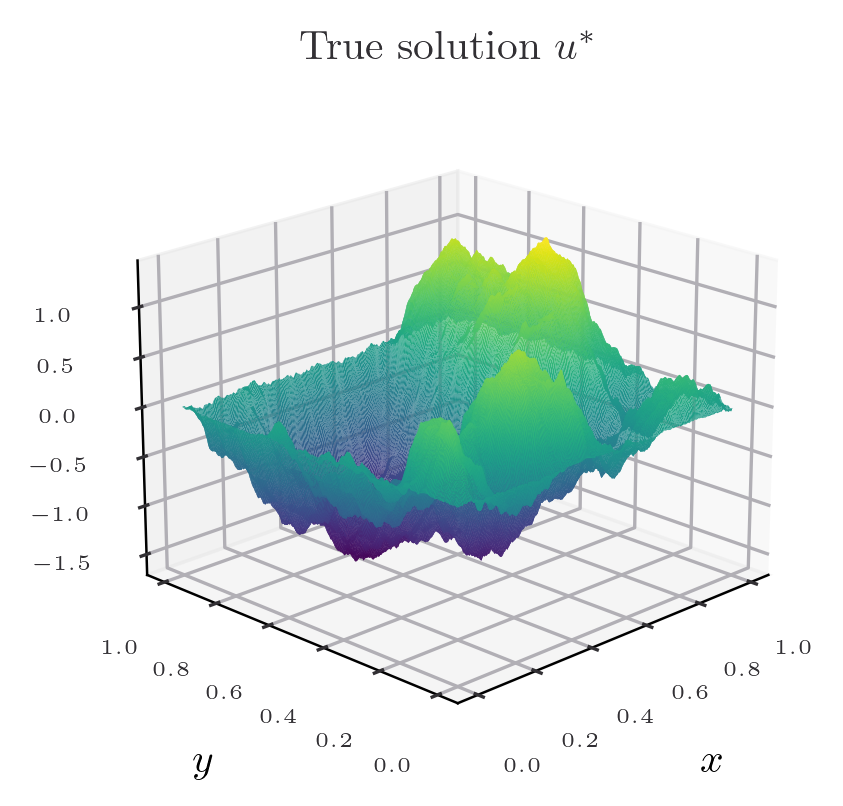

In [85]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, u_eval,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"True solution $u^*$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

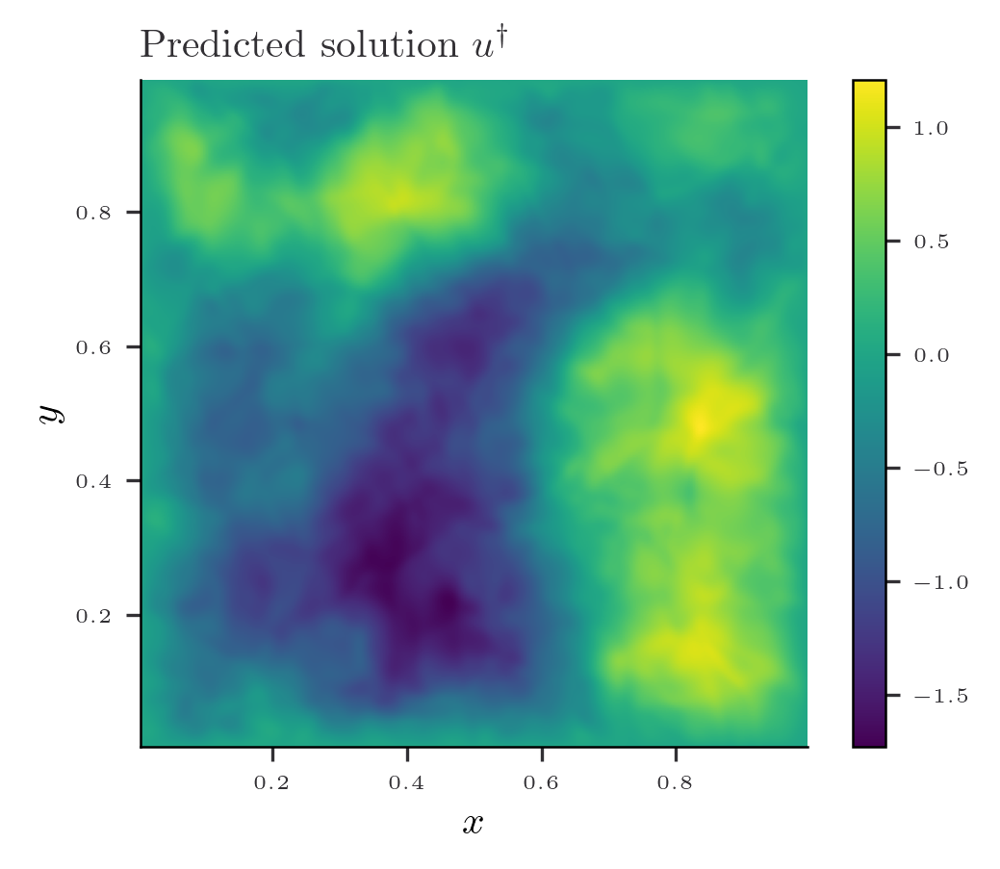

In [86]:
fig = plt.figure(figsize=(width, height))

plt.imshow(pred_grid, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Predicted solution $u^\dagger$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

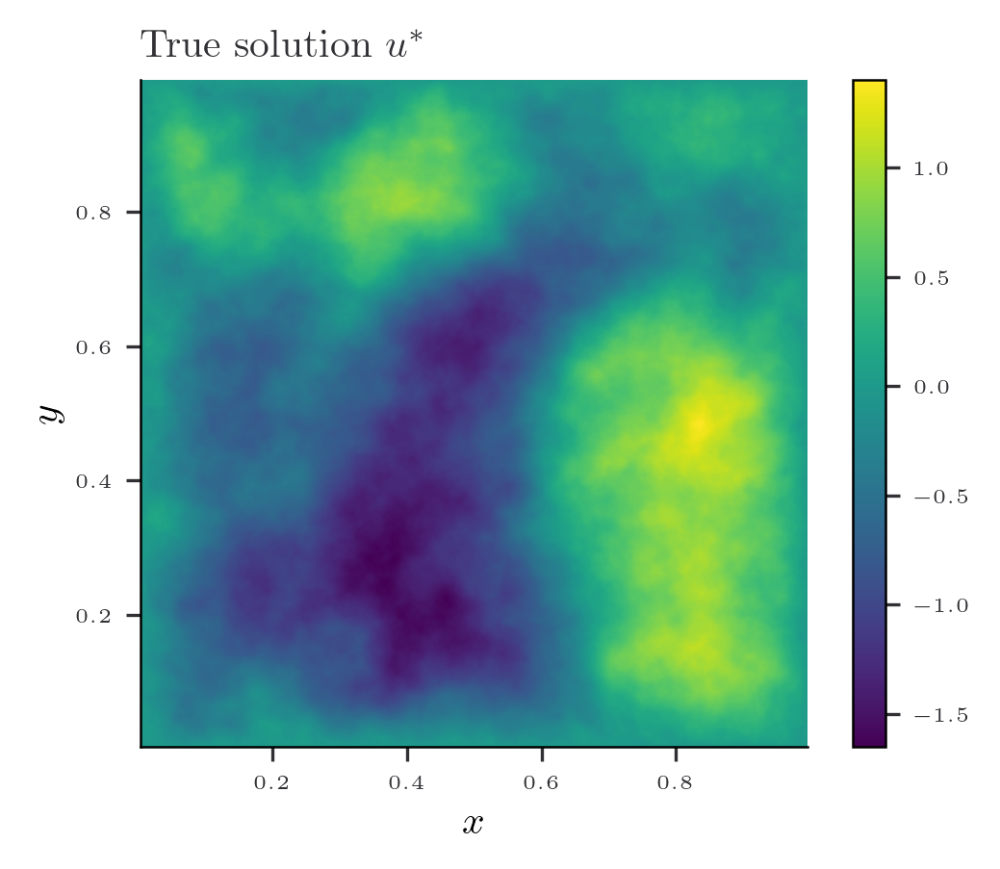

In [87]:
fig = plt.figure(figsize=(width, height))

plt.imshow(u_values, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'True solution $u^*$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

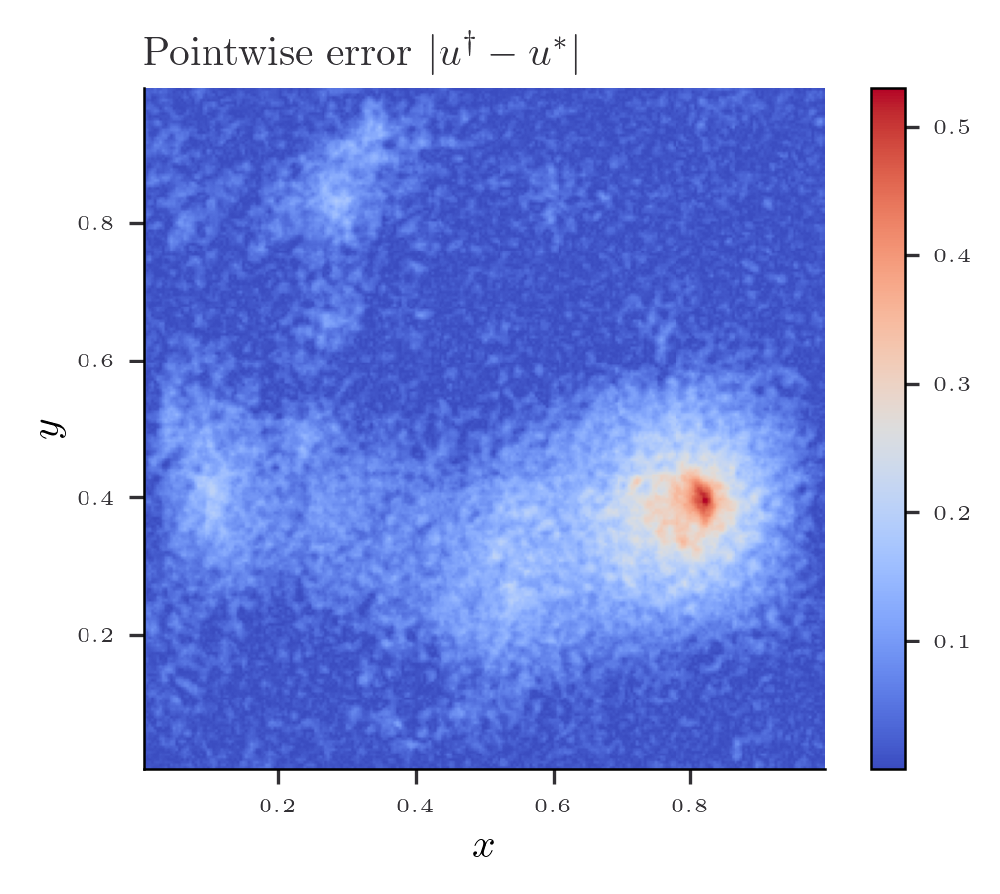

In [88]:
fig = plt.figure(figsize=(width, height))

plt.imshow(jnp.abs(pred_grid - u_eval), cmap='coolwarm', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Pointwise error $|u^\dagger - u^*|$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

# RFF embedding + $H^{-1.1}$ norm

In [124]:
t = s + 0.1
t

1.1

In [125]:
decay_nugget =  decay = (jnp.arange(1,n_points + 1)[None]**2 + jnp.arange(1,n_points+1)[:,None]**2)**(-t/2)
decay_nugget

Array([[0.68302013, 0.41263541, 0.28183829, ..., 0.0106735 , 0.01048734,
        0.01030727],
       [0.41263541, 0.31864016, 0.24396704, ..., 0.01066893, 0.01048298,
        0.01030312],
       [0.28183829, 0.24396704, 0.20398589, ..., 0.01066131, 0.01047573,
        0.01029622],
       ...,
       [0.0106735 , 0.01066893, 0.01066131, ..., 0.00729126, 0.00722687,
        0.00716306],
       [0.01048734, 0.01048298, 0.01047573, ..., 0.00722687, 0.00716405,
        0.00710179],
       [0.01030727, 0.01030312, 0.01029622, ..., 0.00716306, 0.00710179,
        0.00704102]], dtype=float64, weak_type=True)

In [126]:
# Draw random samples for the RF part
n_samples = 32
print('Number of samples: ', n_samples)
d_in = 2

sigma_rff = 5.0
random_features = random.normal(random.PRNGKey(123),  shape = (n_samples, d_in))*sigma_rff


def feature_map(x, random_features):
    outputs = jnp.dot(random_features, x)
    return jnp.hstack([jnp.cos(outputs), jnp.sin(outputs)])

Number of samples:  32


In [127]:
layer_sizes = [n_samples*2, 64, 64,  1]
key = random.PRNGKey(0)
params = init_params(layer_sizes, key)
print("There are {} parameters in the neural network.".format(count_parameters(params)))

There are 8385 parameters in the neural network.


In [128]:
def predict(params, x):
    activations = feature_map(x, random_features)
    for weights, biases in params[:-1]:
        activations = jnp.tanh(jnp.dot(activations, weights) + biases)
    final_weights, final_biases = params[-1]
    return jnp.squeeze(jnp.dot(activations, final_weights) + final_biases)

In [129]:
neural_network = jit(vmap(predict, in_axes=(None, 0)))
def laplacian(params, x):
    return jnp.trace(hessian(predict, argnums=-1)(params, x))
nn_laplacian = jit(vmap(laplacian, in_axes = (None, 0)))

In [130]:
# Define the loss function
def loss_fn(params, grid, boundary, f, boundary_conditions, nu, n_points, w = 1.0):
    u_grid = neural_network(params, grid).reshape(n_points, n_points)
    non_linearity = tau(u_grid)
    laplacian_grid = nn_laplacian(params, grid).reshape(n_points, n_points)
    # Compute the sine transform
    pred_sine = compute_sine_coef_2d(-nu*laplacian_grid + vmap_b(x,y)*u_grid+ non_linearity)
    residual_interior = (pred_sine - f)*  

    pred_boundary = neural_network(params, boundary)
    residual_boundary = pred_boundary - boundary_conditions
    return w*jnp.mean(residual_interior**2) + jnp.mean(residual_boundary**2)

In [131]:
f_observed =  coef_f[:n_points,:n_points]
f_observed

Array([[-0.82089554, -2.14859284,  2.3791985 , ...,  0.26563585,
        -0.7940723 , -0.17793415],
       [ 0.84933138,  2.84151398, -1.39662649, ..., -0.15709004,
        -0.48139546,  2.28038787],
       [-0.29017643,  1.06693573, -0.38861401, ...,  0.37299521,
         1.77593612, -0.9827744 ],
       ...,
       [ 0.35287707,  0.63489338,  0.39130747, ...,  2.12387259,
         1.12427352,  0.40291486],
       [ 0.86676858, -1.26121217,  0.52391445, ..., -0.49089108,
        -1.24617576, -0.99688064],
       [ 0.89848174, -1.04691187,  2.99439876, ...,  0.11065843,
         2.65018724,  0.20170837]], dtype=float64)

In [132]:
loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points, w = 1.0)
print(loss, grads)

0.8472939134299099 [(Array([[ 0.00754388,  0.02150294, -0.00937539, ...,  0.00198775,
         0.05535719, -0.00503827],
       [ 0.01378096,  0.02102223, -0.02452276, ...,  0.0044415 ,
         0.06511851, -0.00140403],
       [-0.02659999, -0.00907401,  0.05886126, ..., -0.03285489,
        -0.10204331,  0.00582385],
       ...,
       [ 0.02668862,  0.01103926, -0.05056259, ...,  0.01953772,
         0.10028923, -0.0048415 ],
       [-0.01508403, -0.02002816,  0.01644864, ...,  0.00258092,
        -0.07299544, -0.00219805],
       [-0.00384774,  0.00024408,  0.01640042, ..., -0.02536876,
         0.00676728, -0.00392563]], dtype=float64), Array([-0.01758753, -0.00807739,  0.04871405,  0.10868568,  0.17920721,
        0.05526937, -0.13940339,  0.03048955, -0.01893092, -0.14392004,
        0.00653699, -0.00817083,  0.05801785,  0.03584136,  0.02389483,
        0.07112224,  0.09559328,  0.1045556 , -0.1550255 , -0.00307296,
       -0.02013625, -0.05017594, -0.02117999, -0.03397533, -0.

In [133]:
# Define the learning rate scheduler
initial_learning_rate = 1e-3
num_epochs = 1e5
decay_steps = num_epochs/10
decay_rate = 0.9

learning_rate_schedule = optax.exponential_decay(
    init_value=initial_learning_rate,
    transition_steps=decay_steps,
    decay_rate=decay_rate,
    transition_begin=0,
    staircase=False
)
optimizer = optax.adam(learning_rate_schedule)
opt_state = optimizer.init(params)

In [134]:
@jit
def train_step(params, opt_state):
    loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points)
    updates, opt_state = optimizer.update(grads, opt_state, params)
    params = optax.apply_updates(params, updates)
    return params, opt_state, loss


In [135]:
patience = jnp.inf  # Number of epochs to wait for improvement
best_loss = float('inf')
epochs_without_improvement = 0

In [136]:
loss_hist = []
for epoch in range(int(num_epochs)):
    params, opt_state, loss = train_step(params, opt_state)
    if epoch % 1e4 == 0:
        print(f'Epoch {epoch}, Loss: {loss:.7f}')
    loss_hist.append(loss)

    if epoch % decay_steps == 0:
        current_learning_rate = learning_rate_schedule(epoch)
        print(f'Step {epoch}, Training Loss: {loss:.7f}, Learning Rate: {current_learning_rate:.6f}')

    if loss < best_loss:
        best_loss = loss
        epochs_without_improvement = 0
        #best_param = params.copy()
    else:
        epochs_without_improvement += 1

    if epochs_without_improvement >= patience:
        print(f'Early stopping at epoch {epoch}')
        break

Epoch 0, Loss: 0.8472939
Step 0, Training Loss: 0.8472939, Learning Rate: 0.001000
Epoch 10000, Loss: 0.0002189
Step 10000, Training Loss: 0.0002189, Learning Rate: 0.000900
Epoch 20000, Loss: 0.0001795
Step 20000, Training Loss: 0.0001795, Learning Rate: 0.000810
Epoch 30000, Loss: 0.0001417
Step 30000, Training Loss: 0.0001417, Learning Rate: 0.000729
Epoch 40000, Loss: 0.0001178
Step 40000, Training Loss: 0.0001178, Learning Rate: 0.000656
Epoch 50000, Loss: 0.0001011
Step 50000, Training Loss: 0.0001011, Learning Rate: 0.000590
Epoch 60000, Loss: 0.0000908
Step 60000, Training Loss: 0.0000908, Learning Rate: 0.000531
Epoch 70000, Loss: 0.0000823
Step 70000, Training Loss: 0.0000823, Learning Rate: 0.000478
Epoch 80000, Loss: 0.0000769
Step 80000, Training Loss: 0.0000769, Learning Rate: 0.000430
Epoch 90000, Loss: 0.0000688
Step 90000, Training Loss: 0.0000688, Learning Rate: 0.000387


In [137]:
loss

Array(6.31133124e-05, dtype=float64)

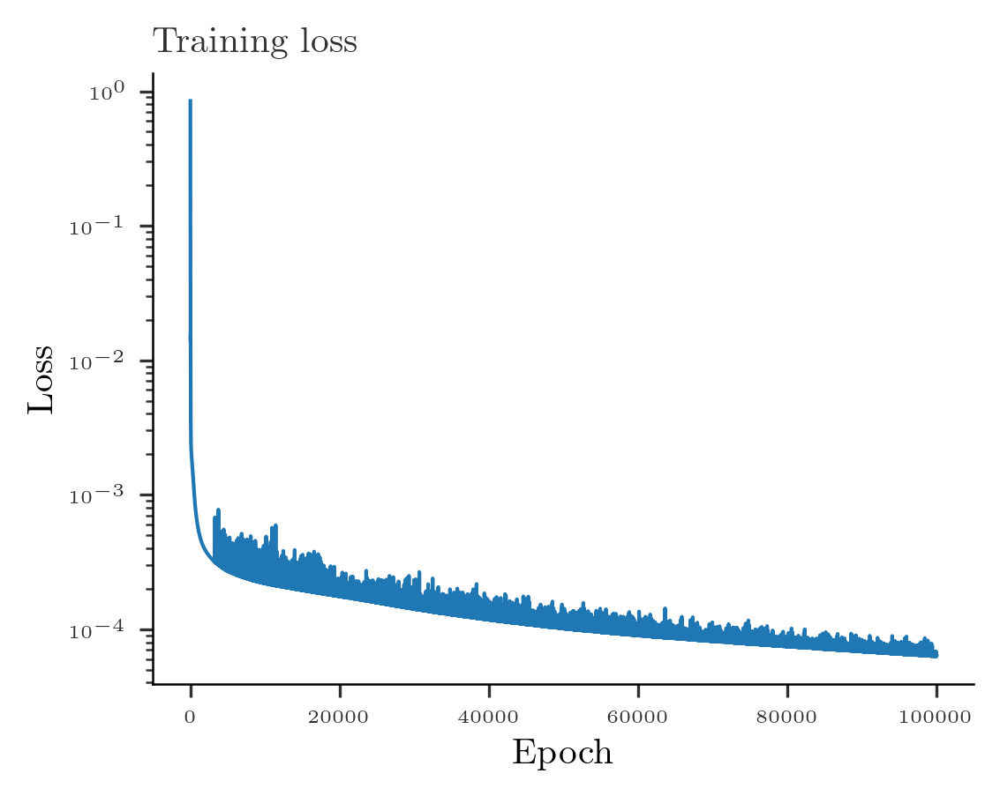

In [138]:
fig = plt.figure(figsize=(width, height))
plt.plot(loss_hist)
plt.yscale('log')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training loss')
plt.show()

In [139]:
pred_grid = neural_network(params, interior_eval).reshape(n_eval, n_eval)

In [168]:
pred_grid.shape

(256, 256)

In [140]:
print(compute_2d_error(pred_grid, u_eval, x_eval, y_eval))

(Array(0.03128375, dtype=float64), Array(0.04630461, dtype=float64))


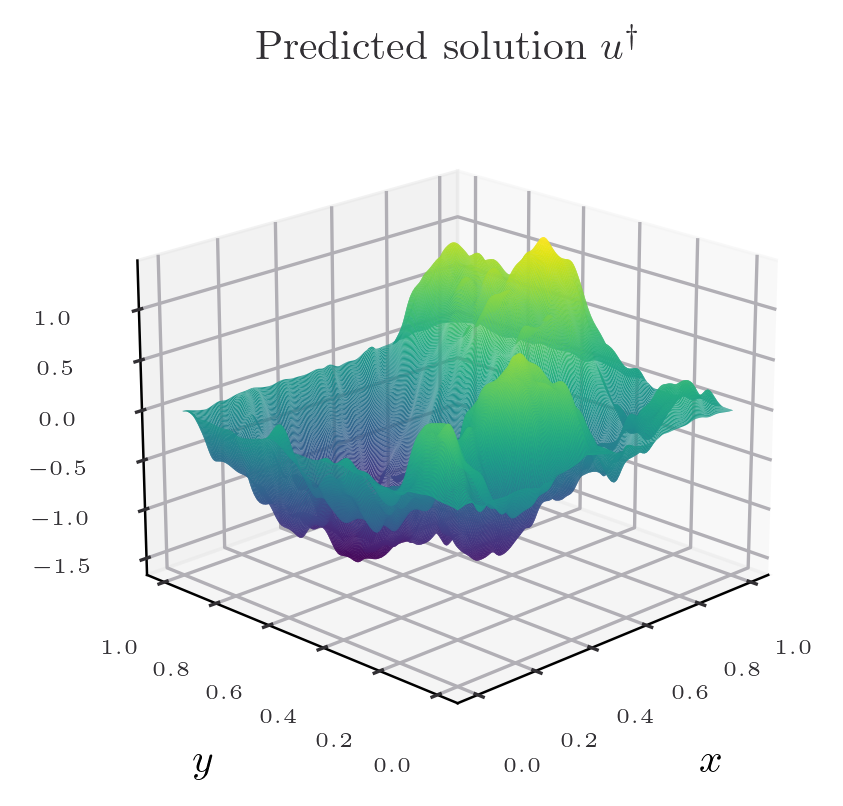

In [141]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, pred_grid,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Predicted solution $u^\dagger$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

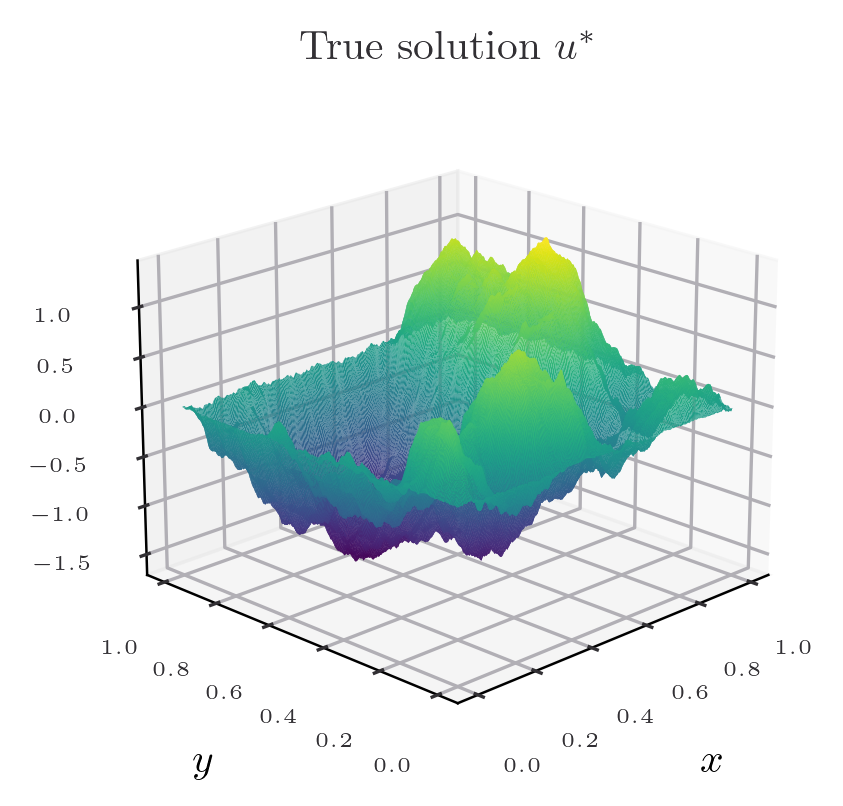

In [142]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, u_eval,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"True solution $u^*$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

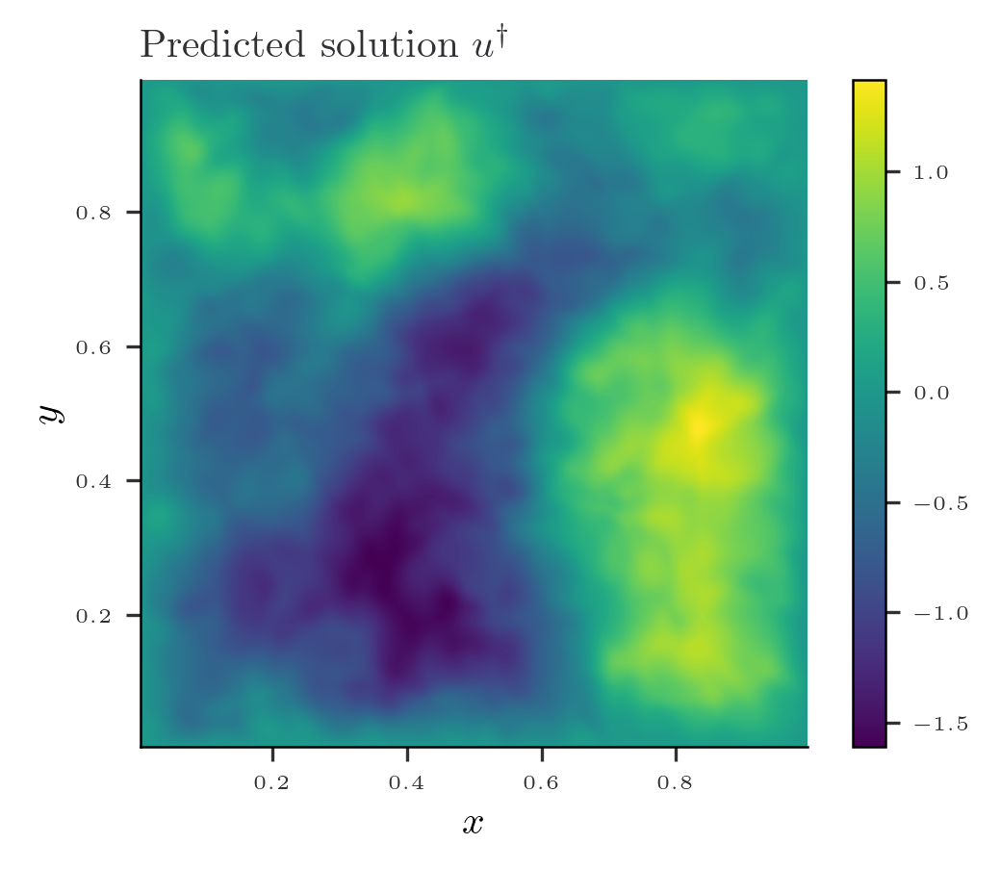

In [143]:
fig = plt.figure(figsize=(width, height))

plt.imshow(pred_grid, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Predicted solution $u^\dagger$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

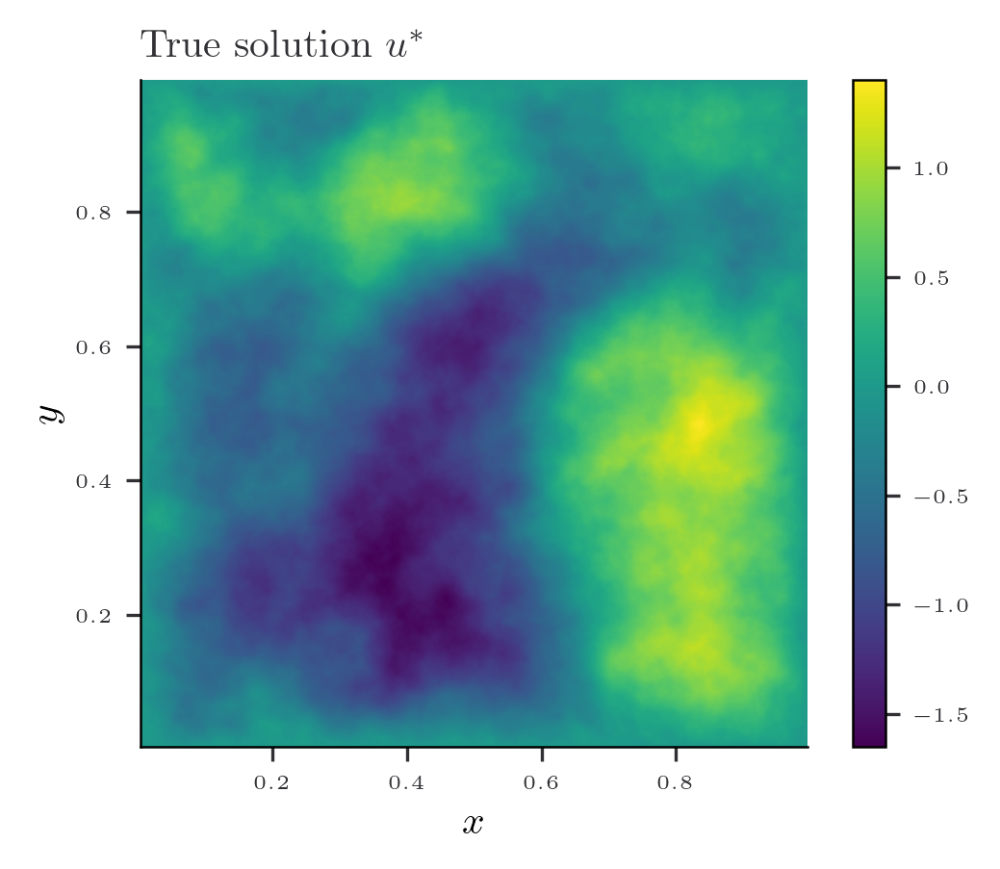

In [144]:
fig = plt.figure(figsize=(width, height))

plt.imshow(u_values, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'True solution $u^*$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

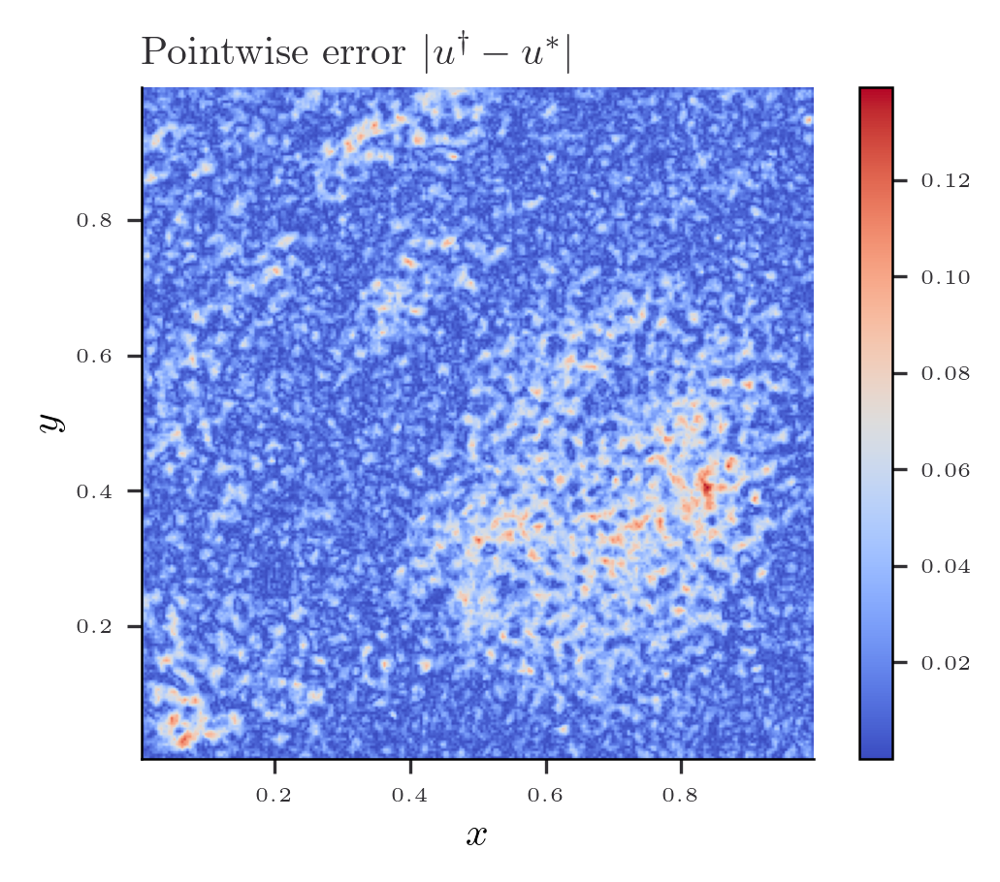

In [145]:
fig = plt.figure(figsize=(width, height))

plt.imshow(jnp.abs(pred_grid - u_eval), cmap='coolwarm', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Pointwise error $|u^\dagger - u^*|$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

# RFF embedding + $H^{-2}$ norm

In [146]:
t = 2.0
t

2.0

In [147]:
decay_nugget =  decay = (jnp.arange(1,n_points + 1)[None]**2 + jnp.arange(1,n_points+1)[:,None]**2)**(-t/2)
decay_nugget

Array([[5.00000000e-01, 2.00000000e-01, 1.00000000e-01, ...,
        2.60078023e-04, 2.51889169e-04, 2.44081035e-04],
       [2.00000000e-01, 1.25000000e-01, 7.69230769e-02, ...,
        2.59875260e-04, 2.51698968e-04, 2.43902439e-04],
       [1.00000000e-01, 7.69230769e-02, 5.55555556e-02, ...,
        2.59538022e-04, 2.51382604e-04, 2.43605359e-04],
       ...,
       [2.60078023e-04, 2.59875260e-04, 2.59538022e-04, ...,
        1.30072841e-04, 1.27991809e-04, 1.25944584e-04],
       [2.51889169e-04, 2.51698968e-04, 2.51382604e-04, ...,
        1.27991809e-04, 1.25976316e-04, 1.23992560e-04],
       [2.44081035e-04, 2.43902439e-04, 2.43605359e-04, ...,
        1.25944584e-04, 1.23992560e-04, 1.22070312e-04]],      dtype=float64, weak_type=True)

In [148]:
# Draw random samples for the RF part
n_samples = 32
print('Number of samples: ', n_samples)
d_in = 2

sigma_rff = 5.0
random_features = random.normal(random.PRNGKey(123),  shape = (n_samples, d_in))*sigma_rff


def feature_map(x, random_features):
    outputs = jnp.dot(random_features, x)
    return jnp.hstack([jnp.cos(outputs), jnp.sin(outputs)])

Number of samples:  32


In [149]:
layer_sizes = [n_samples*2, 64, 64,  1]
key = random.PRNGKey(0)
params = init_params(layer_sizes, key)
print("There are {} parameters in the neural network.".format(count_parameters(params)))

There are 8385 parameters in the neural network.


In [150]:
def predict(params, x):
    activations = feature_map(x, random_features)
    for weights, biases in params[:-1]:
        activations = jnp.tanh(jnp.dot(activations, weights) + biases)
    final_weights, final_biases = params[-1]
    return jnp.squeeze(jnp.dot(activations, final_weights) + final_biases)

In [151]:
neural_network = jit(vmap(predict, in_axes=(None, 0)))
def laplacian(params, x):
    return jnp.trace(hessian(predict, argnums=-1)(params, x))
nn_laplacian = jit(vmap(laplacian, in_axes = (None, 0)))

In [152]:
# Define the loss function
def loss_fn(params, grid, boundary, f, boundary_conditions, nu, n_points, w = 1.0):
    u_grid = neural_network(params, grid).reshape(n_points, n_points)
    non_linearity = tau(u_grid)
    laplacian_grid = nn_laplacian(params, grid).reshape(n_points, n_points)
    # Compute the sine transform
    pred_sine = compute_sine_coef_2d(-nu*laplacian_grid + vmap_b(x,y)*u_grid+ non_linearity)
    residual_interior = (pred_sine - f)*decay_nugget

    pred_boundary = neural_network(params, boundary)
    residual_boundary = pred_boundary - boundary_conditions
    return w*jnp.mean(residual_interior**2) + jnp.mean(residual_boundary**2)

In [153]:
f_observed =  coef_f[:n_points,:n_points]
f_observed

Array([[-0.82089554, -2.14859284,  2.3791985 , ...,  0.26563585,
        -0.7940723 , -0.17793415],
       [ 0.84933138,  2.84151398, -1.39662649, ..., -0.15709004,
        -0.48139546,  2.28038787],
       [-0.29017643,  1.06693573, -0.38861401, ...,  0.37299521,
         1.77593612, -0.9827744 ],
       ...,
       [ 0.35287707,  0.63489338,  0.39130747, ...,  2.12387259,
         1.12427352,  0.40291486],
       [ 0.86676858, -1.26121217,  0.52391445, ..., -0.49089108,
        -1.24617576, -0.99688064],
       [ 0.89848174, -1.04691187,  2.99439876, ...,  0.11065843,
         2.65018724,  0.20170837]], dtype=float64)

In [154]:
loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points, w = 1.0)
print(loss, grads)

0.8450150264568608 [(Array([[ 0.00755279,  0.02145598, -0.00952265, ...,  0.002073  ,
         0.05540291, -0.00506236],
       [ 0.01376638,  0.0209867 , -0.0245456 , ...,  0.00443107,
         0.06512467, -0.0014    ],
       [-0.0265922 , -0.00905368,  0.05884206, ..., -0.03287165,
        -0.1020017 ,  0.00582032],
       ...,
       [ 0.02668195,  0.01100095, -0.05058411, ...,  0.01955747,
         0.10025812, -0.00483727],
       [-0.01508945, -0.02002878,  0.01644513, ...,  0.00258743,
        -0.07302612, -0.0021981 ],
       [-0.00386945,  0.00024256,  0.0164014 , ..., -0.02537507,
         0.00674493, -0.00392425]], dtype=float64), Array([-0.01758683, -0.00810568,  0.04874331,  0.10866651,  0.17920421,
        0.0552493 , -0.139402  ,  0.03049605, -0.01895618, -0.14379992,
        0.00647873, -0.00816674,  0.05814921,  0.03588666,  0.0239056 ,
        0.07112023,  0.09546284,  0.10465468, -0.15505693, -0.00305999,
       -0.02014426, -0.05008806, -0.02114317, -0.03399093, -0.

In [155]:
# Define the learning rate scheduler
initial_learning_rate = 1e-3
num_epochs = 1e5
decay_steps = num_epochs/10
decay_rate = 0.9

learning_rate_schedule = optax.exponential_decay(
    init_value=initial_learning_rate,
    transition_steps=decay_steps,
    decay_rate=decay_rate,
    transition_begin=0,
    staircase=False
)
optimizer = optax.adam(learning_rate_schedule)
opt_state = optimizer.init(params)

In [156]:
@jit
def train_step(params, opt_state):
    loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points)
    updates, opt_state = optimizer.update(grads, opt_state, params)
    params = optax.apply_updates(params, updates)
    return params, opt_state, loss


In [157]:
patience = jnp.inf  # Number of epochs to wait for improvement
best_loss = float('inf')
epochs_without_improvement = 0

In [158]:
loss_hist = []
for epoch in range(int(num_epochs)):
    params, opt_state, loss = train_step(params, opt_state)
    if epoch % 1e4 == 0:
        print(f'Epoch {epoch}, Loss: {loss:.7f}')
    loss_hist.append(loss)

    if epoch % decay_steps == 0:
        current_learning_rate = learning_rate_schedule(epoch)
        print(f'Step {epoch}, Training Loss: {loss:.7f}, Learning Rate: {current_learning_rate:.6f}')

    if loss < best_loss:
        best_loss = loss
        epochs_without_improvement = 0
        #best_param = params.copy()
    else:
        epochs_without_improvement += 1

    if epochs_without_improvement >= patience:
        print(f'Early stopping at epoch {epoch}')
        break

Epoch 0, Loss: 0.8450150
Step 0, Training Loss: 0.8450150, Learning Rate: 0.001000
Epoch 10000, Loss: 0.0000044
Step 10000, Training Loss: 0.0000044, Learning Rate: 0.000900
Epoch 20000, Loss: 0.0000024
Step 20000, Training Loss: 0.0000024, Learning Rate: 0.000810
Epoch 30000, Loss: 0.0000065
Step 30000, Training Loss: 0.0000065, Learning Rate: 0.000729
Epoch 40000, Loss: 0.0000045
Step 40000, Training Loss: 0.0000045, Learning Rate: 0.000656
Epoch 50000, Loss: 0.0000030
Step 50000, Training Loss: 0.0000030, Learning Rate: 0.000590
Epoch 60000, Loss: 0.0000020
Step 60000, Training Loss: 0.0000020, Learning Rate: 0.000531
Epoch 70000, Loss: 0.0000009
Step 70000, Training Loss: 0.0000009, Learning Rate: 0.000478
Epoch 80000, Loss: 0.0000008
Step 80000, Training Loss: 0.0000008, Learning Rate: 0.000430
Epoch 90000, Loss: 0.0000024
Step 90000, Training Loss: 0.0000024, Learning Rate: 0.000387


In [159]:
loss

Array(7.84670295e-07, dtype=float64)

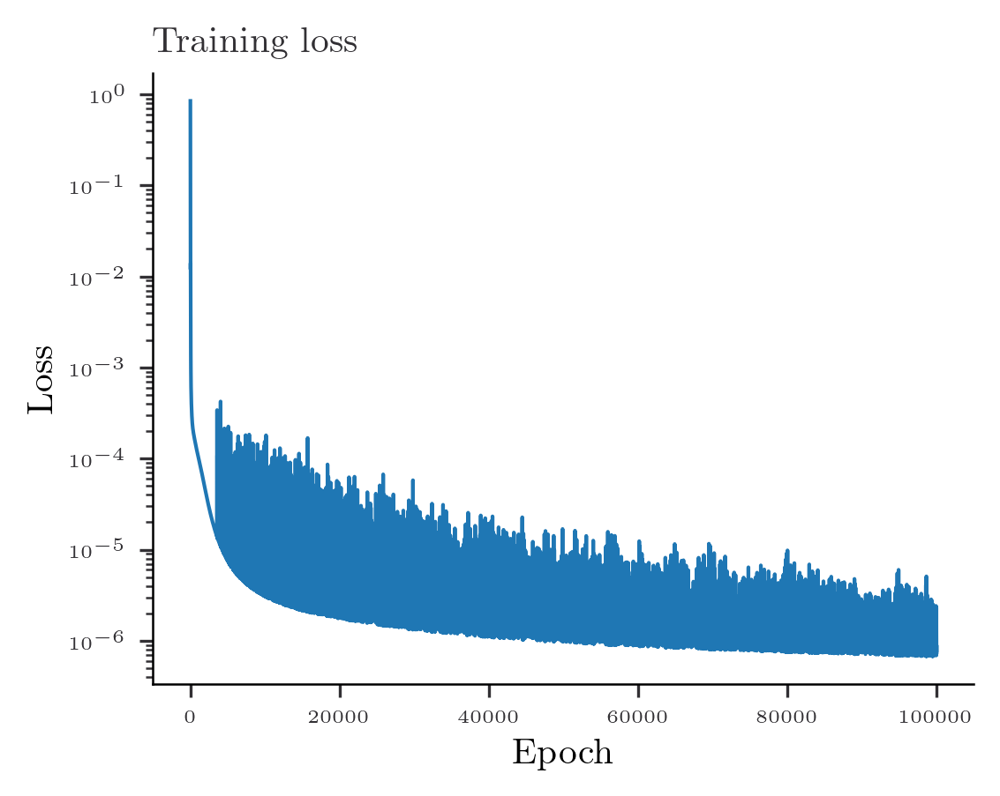

In [160]:
fig = plt.figure(figsize=(width, height))
plt.plot(loss_hist)
plt.yscale('log')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training loss')
plt.show()

In [161]:
pred_grid = neural_network(params, interior_eval).reshape(n_eval, n_eval)

In [162]:
print(compute_2d_error(pred_grid, u_eval, x_eval, y_eval))

(Array(0.05515284, dtype=float64), Array(0.08163442, dtype=float64))


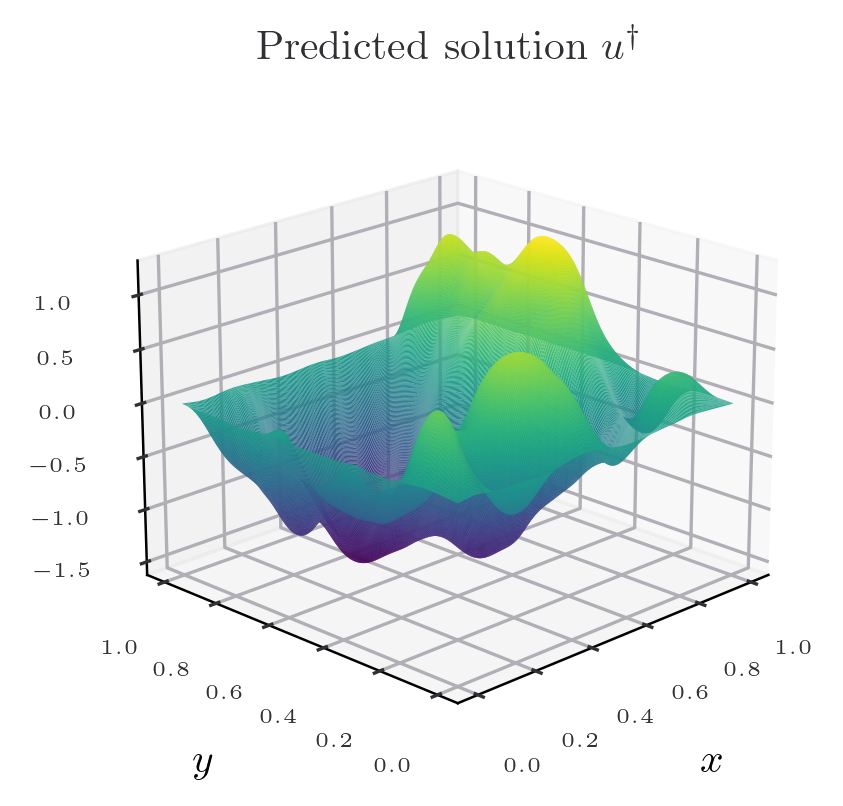

In [163]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, pred_grid,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Predicted solution $u^\dagger$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

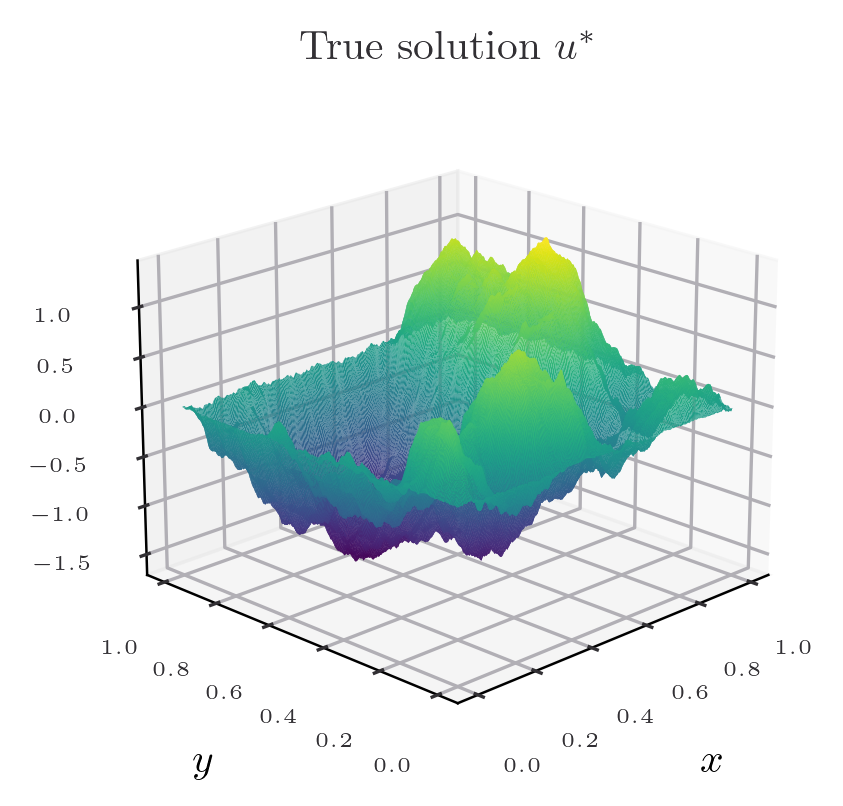

In [164]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 1
ax.plot_surface(X, Y, u_eval,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"True solution $u^*$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

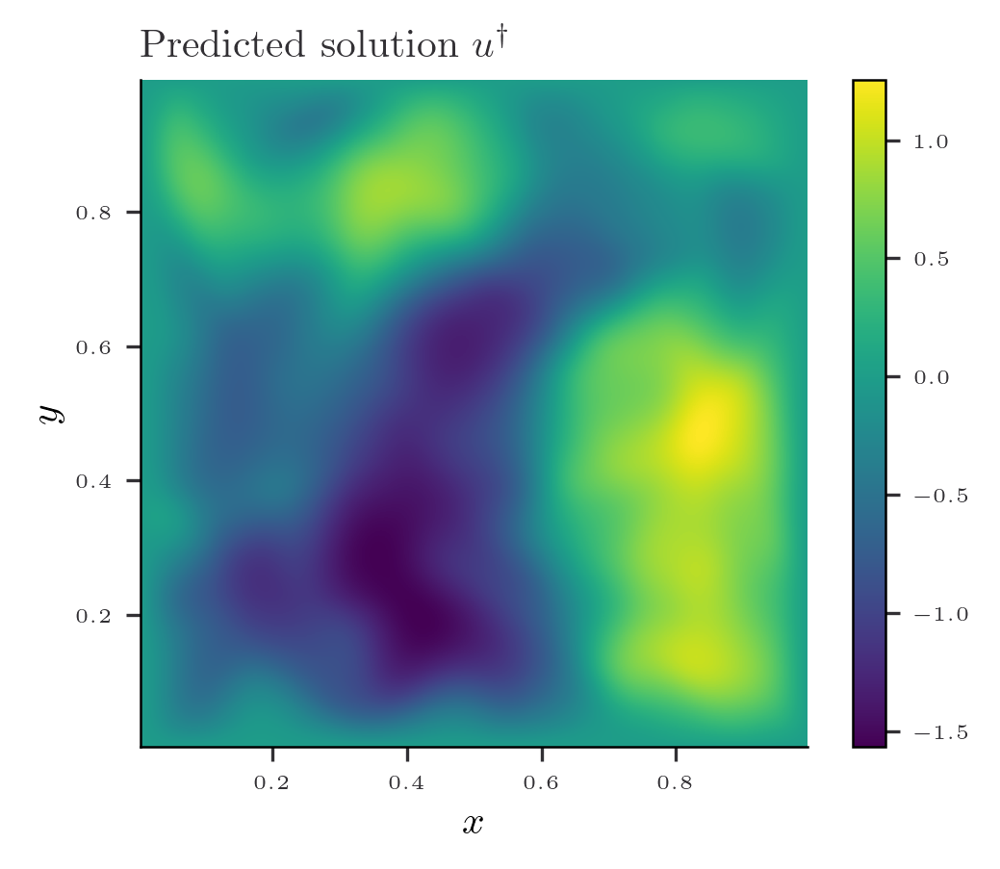

In [165]:
fig = plt.figure(figsize=(width, height))

plt.imshow(pred_grid, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Predicted solution $u^\dagger$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

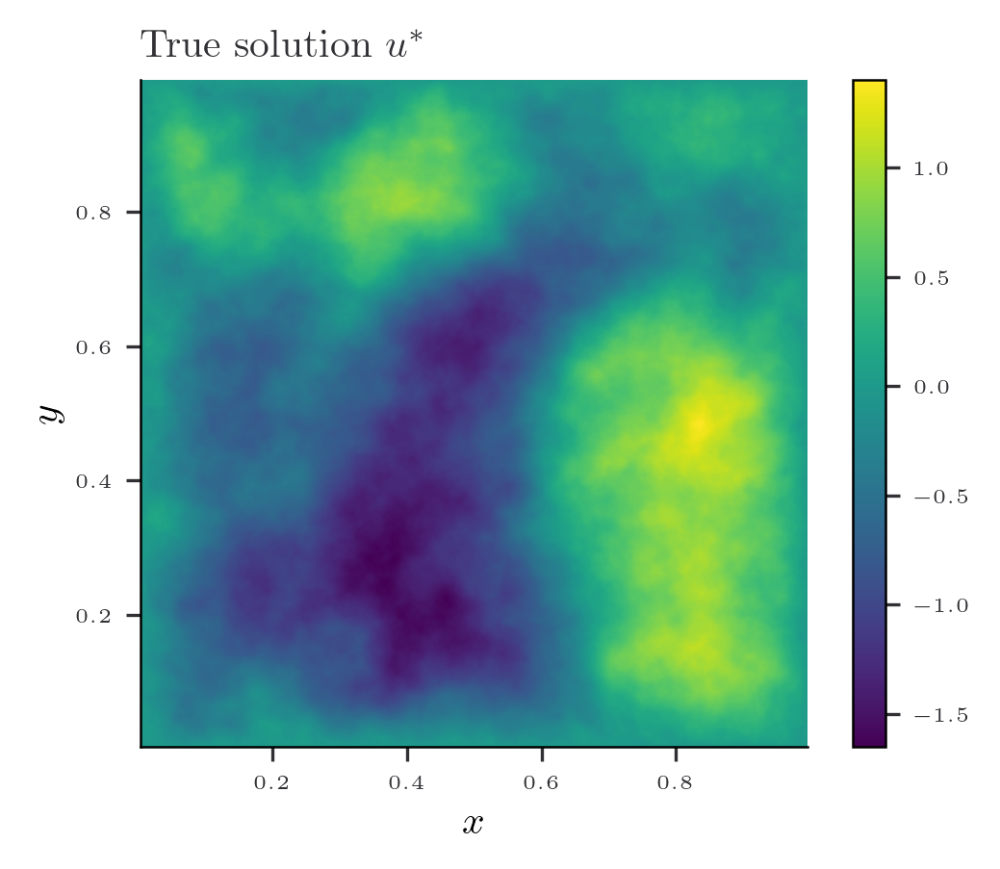

In [166]:
fig = plt.figure(figsize=(width, height))

plt.imshow(u_values, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'True solution $u^*$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

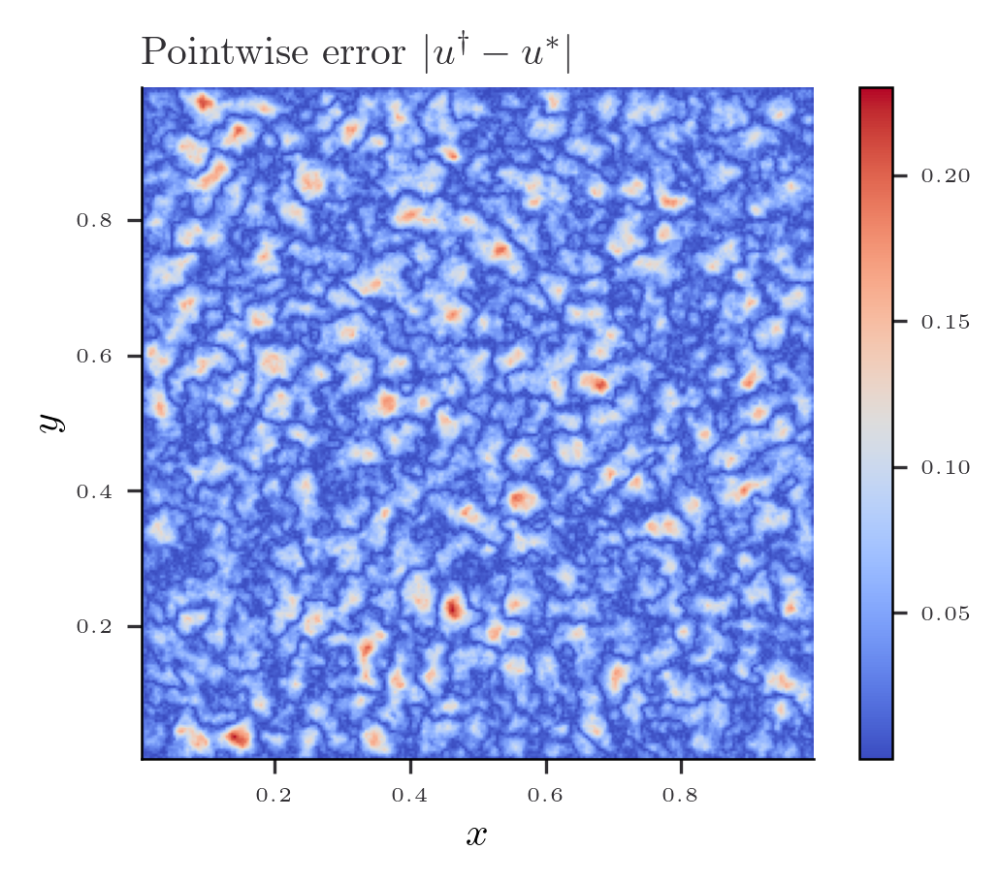

In [167]:
fig = plt.figure(figsize=(width, height))

plt.imshow(jnp.abs(pred_grid - u_eval), cmap='coolwarm', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Pointwise error $|u^\dagger - u^*|$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()